In [ ]:
from sklearn.neighbors import KNeighborsTransformer
import louvain
import igraph
import re
import os
import sys
import json
import gc
import matplotlib as mlt
import scanpy as sc
import numpy as np
import pandas as pd

In [2]:
outputDir="../result/9.18_novel_celltype/"

In [5]:
sc.settings.figdir="../result/9.18_novel_celltype/"

## 选择合适的用作发现新细胞群的参数

In [6]:
adata =sc.read("../../important_processed_data/9.18_intergrate.h5ad")

In [7]:
adata

AnnData object with n_obs × n_vars = 781397 × 20664
    obs: 'Sample', 'Project', 'Core Dataset', 'Limb Atlas', 'Cranial Atlas', 'Organ', 'Tissue', 'Tissue(Specific)', 'Stage', 'Gene type', 'Treatment', 'Age', 'Age(In Detail)', 'Machine', 'Species', 'Isolation approach', 'Digestion', 'Enzymes', 'Cre', 'Bone Forming Methods', 'Data Source', 'Related Assay', 'Cell Count After QC', 'Origin', 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'paper_label', 'coarse_label', 'scDblFinder_class', 'short_id', 'nCount_originalexp', 'nFeature_originalexp', 'n_genes', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'new_totals_log', 'batch', 'log10_total_counts', 'n_genes_detected', 'mito_frac', 'ribo_frac', 'compl', 'transf_ann_level_7_label', 'transf_ann_level_6_label', 'transf_ann_level_5_label', 'transf_ann_level_4_label', 'transf_ann_level_

In [ ]:

def weighted_knn_trainer(train_adata, train_adata_emb, label_key, n_neighbors=50):
    """Trains a weighted KNN classifier on ``train_adata``.
    Parameters
    ----------
    train_adata: :class:`~anndata.AnnData`
        Annotated dataset to be used to train KNN classifier with ``label_key`` as the target variable.
    train_adata_emb: str
        Name of the obsm layer to be used for calculation of neighbors. If set to "X", anndata.X will be
        used
    label_key: str
        Name of the column to be used as target variable (e.g. cell_type) in ``train_adata`` and ``query_adata``.
    n_neighbors: int
        Number of nearest neighbors in KNN classifier.
    """
    print(
        f"Weighted KNN with n_neighbors = {n_neighbors} ... ",
        end="",
    )
    k_neighbors_transformer = KNeighborsTransformer(
        n_neighbors=n_neighbors,
        mode="distance",
        algorithm="brute",
        metric="euclidean",
        n_jobs=-1,
    )
    if train_adata_emb == "X":
        train_emb = train_adata.X
    elif train_adata_emb in train_adata.obsm.keys():
        train_emb = train_adata.obsm[train_adata_emb]
    else:
        raise ValueError(
            "train_adata_emb should be set to either 'X' or the name of the obsm layer to be used!"
        )
    k_neighbors_transformer.fit(train_emb)
    return k_neighbors_transformer


def distance_predict(
    query_adata,
    query_adata_emb,
    ref_adata_obs,
    label_keys,
    knn_model,
    threshold=1,
    pred_unknown=False,
    mode="package",
):
    """Annotates ``query_adata`` cells with an input trained weighted KNN classifier.
    Parameters
    ----------
    query_adata: :class:`~anndata.AnnData`
        Annotated dataset to be used to queryate KNN classifier. Embedding to be used
    query_adata_emb: str
        Name of the obsm layer to be used for label transfer. If set to "X",
        query_adata.X will be used
    ref_adata_obs: :class:`pd.DataFrame`
        obs of ref Anndata
    label_keys: str
        Names of the columns to be used as target variables (e.g. cell_type) in ``query_adata``.
    knn_model: :class:`~sklearn.neighbors._graph.KNeighborsTransformer`
        knn model trained on reference adata with weighted_knn_trainer function
    threshold: float
        Threshold of uncertainty used to annotating cells as "Unknown". cells with
        uncertainties higher than this value will be annotated as "Unknown".
        Set to 1 to keep all predictions. This enables one to later on play
        with thresholds.
    pred_unknown: bool
        ``False`` by default. Whether to annotate any cell as "unknown" or not.
        If `False`, ``threshold`` will not be used and each cell will be annotated
        with the label which is the most common in its ``n_neighbors`` nearest cells.
    mode: str
        Has to be one of "paper" or "package". If mode is set to "package",
        uncertainties will be 1 - P(pred_label), otherwise it will be 1 - P(true_label).
    """
    if not type(knn_model) == KNeighborsTransformer:
        raise ValueError(
            "knn_model should be of type sklearn.neighbors._graph.KNeighborsTransformer!"
        )

    if query_adata_emb == "X":
        query_emb = query_adata.X
    elif query_adata_emb in query_adata.obsm.keys():
        query_emb = query_adata.obsm[query_adata_emb]
    else:
        raise ValueError(
            "query_adata_emb should be set to either 'X' or the name of the obsm layer to be used!"
        )
    top_k_distances, top_k_indices = knn_model.kneighbors(X=query_emb)
    distance=top_k_distances.sum()
    stds = np.std(top_k_distances, axis=1)
    stds = (2.0 / stds) ** 2
    stds = stds.reshape(-1, 1)

    top_k_distances_tilda = np.exp(-np.true_divide(top_k_distances, stds))

    weights = top_k_distances_tilda / np.sum(
        top_k_distances_tilda, axis=1, keepdims=True
    )
    cols = ref_adata_obs.columns[ref_adata_obs.columns.str.endswith(label_keys)]
    uncertainties = pd.DataFrame(columns=cols, index=query_adata.obs_names)
    pred_labels = pd.DataFrame(columns=cols, index=query_adata.obs_names)
    for i in range(len(weights)):
        for j in cols:
            y_train_labels = ref_adata_obs[j].values
            unique_labels = np.unique(y_train_labels[top_k_indices[i]])
            best_label, best_prob = None, 0.0
            for candidate_label in unique_labels:
                candidate_prob = weights[
                    i, y_train_labels[top_k_indices[i]] == candidate_label
                ].sum()
                if best_prob < candidate_prob:
                    best_prob = candidate_prob
                    best_label = candidate_label

            if pred_unknown:
                if best_prob >= threshold:
                    pred_label = best_label
                else:
                    pred_label = "Unknown"
            else:
                pred_label = best_label

            if mode == "package":
                uncertainties.iloc[i][j] = (max(1 - best_prob, 0))

            else:
                raise Exception("Inquery Mode!")

            pred_labels.iloc[i][j] = (pred_label)

    print("finished!")

    return pred_labels, uncertainties

In [1049]:
top_k_distances, top_k_indices = k_neighbors_transformer.kneighbors(X=query_emb)

AnnData object with n_obs × n_vars = 781397 × 20664
    obs: 'Sample', 'Project', 'Core Dataset', 'Limb Atlas', 'Cranial Atlas', 'Organ', 'Tissue', 'Tissue(Specific)', 'Stage', 'Gene type', 'Treatment', 'Age', 'Age(In Detail)', 'Machine', 'Species', 'Isolation approach', 'Digestion', 'Enzymes', 'Cre', 'Bone Forming Methods', 'Data Source', 'Related Assay', 'Cell Count After QC', 'Origin', 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'paper_label', 'coarse_label', 'scDblFinder_class', 'short_id', 'nCount_originalexp', 'nFeature_originalexp', 'n_genes', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'new_totals_log', 'batch', 'log10_total_counts', 'n_genes_detected', 'mito_frac', 'ribo_frac', 'compl', 'transf_ann_level_7_label', 'transf_ann_level_6_label', 'transf_ann_level_5_label', 'transf_ann_level_4_label', 'transf_ann_level_

In [1065]:
def weighted_knn_trainer(train_adata, train_adata_emb, n_neighbors=50):
    """Trains a weighted KNN classifier on ``train_adata``.
    Parameters
    ----------
    train_adata: :class:`~anndata.AnnData`
        Annotated dataset to be used to train KNN classifier with ``label_key`` as the target variable.
    train_adata_emb: str
        Name of the obsm layer to be used for calculation of neighbors. If set to "X", anndata.X will be
        used
    label_key: str
        Name of the column to be used as target variable (e.g. cell_type) in ``train_adata`` and ``query_adata``.
    n_neighbors: int
        Number of nearest neighbors in KNN classifier.
    """
    print(
        f"Weighted KNN with n_neighbors = {n_neighbors} ... ",
        end="",
    )
    k_neighbors_transformer = KNeighborsTransformer(
        n_neighbors=n_neighbors,
        mode="distance",
        algorithm="brute",
        metric="euclidean",
        n_jobs=-1,
    )
    if train_adata_emb == "X":
        train_emb = train_adata.X
    elif train_adata_emb in train_adata.obsm.keys():
        train_emb = train_adata.obsm[train_adata_emb]
    else:
        raise ValueError(
            "train_adata_emb should be set to either 'X' or the name of the obsm layer to be used!"
        )
    k_neighbors_transformer.fit(train_emb)
    return k_neighbors_transformer

def distance_predict(
    query_adata,
    query_adata_emb,
    knn_model,
):
    """Annotates ``query_adata`` cells with an input trained weighted KNN classifier.
    Parameters
    ----------
    query_adata: :class:`~anndata.AnnData`
        Annotated dataset to be used to queryate KNN classifier. Embedding to be used
    query_adata_emb: str
        Name of the obsm layer to be used for label transfer. If set to "X",
        query_adata.X will be used
    ref_adata_obs: :class:`pd.DataFrame`
        obs of ref Anndata
    label_keys: str
        Names of the columns to be used as target variables (e.g. cell_type) in ``query_adata``.
    knn_model: :class:`~sklearn.neighbors._graph.KNeighborsTransformer`
        knn model trained on reference adata with weighted_knn_trainer function
    threshold: float
        Threshold of uncertainty used to annotating cells as "Unknown". cells with
        uncertainties higher than this value will be annotated as "Unknown".
        Set to 1 to keep all predictions. This enables one to later on play
        with thresholds.
    pred_unknown: bool
        ``False`` by default. Whether to annotate any cell as "unknown" or not.
        If `False`, ``threshold`` will not be used and each cell will be annotated
        with the label which is the most common in its ``n_neighbors`` nearest cells.
    mode: str
        Has to be one of "paper" or "package". If mode is set to "package",
        uncertainties will be 1 - P(pred_label), otherwise it will be 1 - P(true_label).
    """
    if not type(knn_model) == KNeighborsTransformer:
        raise ValueError(
            "knn_model should be of type sklearn.neighbors._graph.KNeighborsTransformer!"
        )

    if query_adata_emb == "X":
        query_emb = query_adata.X
    elif query_adata_emb in query_adata.obsm.keys():
        query_emb = query_adata.obsm[query_adata_emb]
    else:
        raise ValueError(
            "query_adata_emb should be set to either 'X' or the name of the obsm layer to be used!"
        )
    top_k_distances, top_k_indices = knn_model.kneighbors(X=query_emb)
    distance= np.mean(top_k_distances, axis=1, keepdims=True)
    distanceDf=pd.DataFrame(columns=["distance"], index=query_adata.obs_names)
    distanceDf["distance"]=distance

    print("finished!")

    return distanceDf

In [1052]:
adata

AnnData object with n_obs × n_vars = 781397 × 20664
    obs: 'Sample', 'Project', 'Core Dataset', 'Limb Atlas', 'Cranial Atlas', 'Organ', 'Tissue', 'Tissue(Specific)', 'Stage', 'Gene type', 'Treatment', 'Age', 'Age(In Detail)', 'Machine', 'Species', 'Isolation approach', 'Digestion', 'Enzymes', 'Cre', 'Bone Forming Methods', 'Data Source', 'Related Assay', 'Cell Count After QC', 'Origin', 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'paper_label', 'coarse_label', 'scDblFinder_class', 'short_id', 'nCount_originalexp', 'nFeature_originalexp', 'n_genes', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'new_totals_log', 'batch', 'log10_total_counts', 'n_genes_detected', 'mito_frac', 'ribo_frac', 'compl', 'transf_ann_level_7_label', 'transf_ann_level_6_label', 'transf_ann_level_5_label', 'transf_ann_level_4_label', 'transf_ann_level_

In [1056]:
reference

AnnData object with n_obs × n_vars = 273479 × 15
    obs: 'orig.ident', 'nCount_originalexp', 'nFeature_originalexp', 'Sample', 'Project', 'Limb.Atlas', 'Organ', 'Tissue', 'Tissue.Specific.', 'Stage', 'Gene.type', 'Treatment', 'Age', 'Age.In.Detail.', 'Machine', 'Species', 'Isolation.approach', 'Digestion', 'Enzymes', 'Cre', 'Bone.Forming.Methods', 'Data.Source', 'Related.Assay', 'Origin', 'nCount_RNA', 'nFeature_RNA', 'paper_label', 'coarse_label', 'C2_named', 'C7_named', 'C19_named', 'C36_named', 'C49_named', 'C90_named', 'C137_named', 'transf_ann_level_7_label', 'transf_ann_level_6_label', 'transf_ann_level_5_label', 'transf_ann_level_4_label', 'transf_ann_level_3_label', 'transf_ann_level_2_label', 'transf_ann_level_1_label', 'n_genes', 'most_confident_level', 'most_confident_uncert', 'most_confident_label', 'transf_ann_level_5_uncert', 'transf_ann_level_4_uncert', 'transf_ann_level_3_uncert', 'transf_ann_level_2_uncert', 'transf_ann_level_1_uncert', 'Tissue.Specific', 'Core_or_Ext

In [1055]:
k_neighbors_transformer=weighted_knn_trainer(reference,"X")

Weighted KNN with n_neighbors = 50 ... 

In [1066]:
disDf=distance_predict(adata,"scANVI",k_neighbors_transformer)

Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<locals>.match_module_callback at 0x7f226c3bdaf0>
Traceback (most recent call last):
  File "/home/zhanglab/mambaforge/envs/celloracle/lib/python3.9/site-packages/threadpoolctl.py", line 400, in match_module_callback
    self._make_module_from_path(filepath)
  File "/home/zhanglab/mambaforge/envs/celloracle/lib/python3.9/site-packages/threadpoolctl.py", line 515, in _make_module_from_path
    module = module_class(filepath, prefix, user_api, internal_api)
  File "/home/zhanglab/mambaforge/envs/celloracle/lib/python3.9/site-packages/threadpoolctl.py", line 606, in __init__
    self.version = self.get_version()
  File "/home/zhanglab/mambaforge/envs/celloracle/lib/python3.9/site-packages/threadpoolctl.py", line 646, in get_version
    config = get_config().split()
AttributeError: 'NoneType' object has no attribute 'split'


finished!


In [1095]:
k_neighbors_transforme_umap=weighted_knn_trainer(reference,"X_umap")
disDf_umap=distance_predict(adata,"X_umap",k_neighbors_transforme_umap)

Weighted KNN with n_neighbors = 50 ... 

Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<locals>.match_module_callback at 0x7f225ee341f0>
Traceback (most recent call last):
  File "/home/zhanglab/mambaforge/envs/celloracle/lib/python3.9/site-packages/threadpoolctl.py", line 400, in match_module_callback
    self._make_module_from_path(filepath)
  File "/home/zhanglab/mambaforge/envs/celloracle/lib/python3.9/site-packages/threadpoolctl.py", line 515, in _make_module_from_path
    module = module_class(filepath, prefix, user_api, internal_api)
  File "/home/zhanglab/mambaforge/envs/celloracle/lib/python3.9/site-packages/threadpoolctl.py", line 606, in __init__
    self.version = self.get_version()
  File "/home/zhanglab/mambaforge/envs/celloracle/lib/python3.9/site-packages/threadpoolctl.py", line 646, in get_version
    config = get_config().split()
AttributeError: 'NoneType' object has no attribute 'split'


finished!


This result explain that umap can distort the distance, so, we cann't choose either umap distance and scANVI distance(because scANVI distance can't tell the new cell type

In [1096]:
adata.obs["pred_distance_umap"]=disDf_umap['distance']

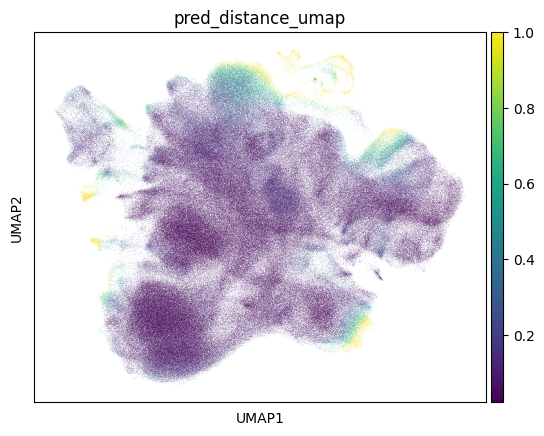

In [1099]:
sc.pl.umap(adata,color="pred_distance_umap",vmax=1)

In [1068]:
adata.obs["pred_distance"]=disDf['distance']

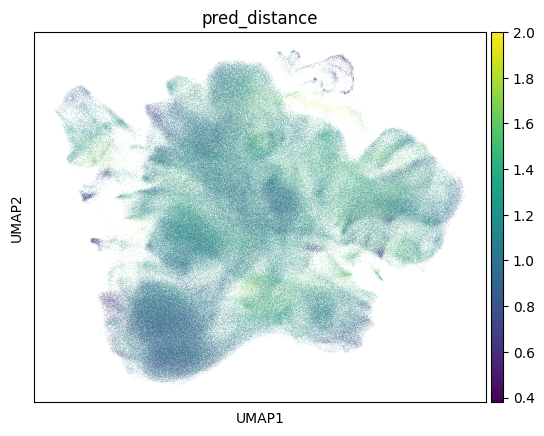

In [1074]:
sc.pl.umap(adata,color="pred_distance",vmax=2)

In [27]:
adata.obs["Core_or_Extand"]="Core"

In [19]:
full_latent=sc.read("../../important_processed_data/9.13_full_latent.h5ad")

In [25]:
full_latent.obs["Sample"][full_latent.obs["Core_or_Extand"]=="Core"].unique()

['Suture2021_Farmer_E17', 'Suture2021_Farmer_E15', 'CranioSoxc_Angelozzi_WTE11.5', 'CranioSoxc_Angelozzi_WTE12.5', 'CranioSoxc_Angelozzi_WTE13.5', ..., 'Metaphysis_Yang_1', 'Metaphysis_Yang_2', 'Metaphysis_Yang_3', 'Metaphysis_Yang_4', 'Metaphysis_Yang_sorted']
Length: 110
Categories (319, object): ['Ablation_Matsushita_abl7con1', 'Ablation_Matsushita_abl7con2', 'Ablation_Matsushita_abl14', 'Ablation_Matsushita_cxcl1', ..., 'lambdoid_Holmes_P28', 'sagittal_Holmes_E18', 'sagittal_Holmes_P10', 'sagittal_Holmes_P28']

In [1084]:
adata.obs["Sample"].isin(query.obs["Sample"].unique())

Suture2021_Farmer_E17_AAACCTGCAGACTCGC-1_1-0_1_1    False
Suture2021_Farmer_E17_AAACCTGGTGCGGTAA-1_1-0_1_1    False
Suture2021_Farmer_E17_AAACCTGGTGGTCTCG-1_1-0_1_1    False
Suture2021_Farmer_E17_AAACCTGTCACCACCT-1_1-0_1_1    False
Suture2021_Farmer_E17_AAACCTGTCGTTACGA-1_1-0_1_1    False
                                                    ...  
TTTGTTGAGGTGATAT-1_8                                 True
TTTGTTGAGTCTTCCC-1_8                                 True
TTTGTTGGTCCACACG-1_8                                 True
TTTGTTGTCACTACGA-1_8                                 True
TTTGTTGTCCGGGACT-1_8                                 True
Name: Sample, Length: 781397, dtype: bool

In [28]:
adata.obs["Core_or_Extand"][adata.obs["Sample"].isin(full_latent.obs["Sample"][full_latent.obs["Core_or_Extand"]=="Extand"].unique())]="Extand"

/tmp/ipykernel_28690/1051689095.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  adata.obs["Core_or_Extand"][adata.obs["Sample"].isin(full_latent.obs["Sample"][full_latent.obs["Core_or_Extand"]=="Extand"].unique())]="Extand"


In [1088]:
a

AnnData object with n_obs × n_vars = 781397 × 20664
    obs: 'Sample', 'Project', 'Core Dataset', 'Limb Atlas', 'Cranial Atlas', 'Organ', 'Tissue', 'Tissue(Specific)', 'Stage', 'Gene type', 'Treatment', 'Age', 'Age(In Detail)', 'Machine', 'Species', 'Isolation approach', 'Digestion', 'Enzymes', 'Cre', 'Bone Forming Methods', 'Data Source', 'Related Assay', 'Cell Count After QC', 'Origin', 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'paper_label', 'coarse_label', 'scDblFinder_class', 'short_id', 'nCount_originalexp', 'nFeature_originalexp', 'n_genes', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'new_totals_log', 'batch', 'log10_total_counts', 'n_genes_detected', 'mito_frac', 'ribo_frac', 'compl', 'transf_ann_level_7_label', 'transf_ann_level_6_label', 'transf_ann_level_5_label', 'transf_ann_level_4_label', 'transf_ann_level_

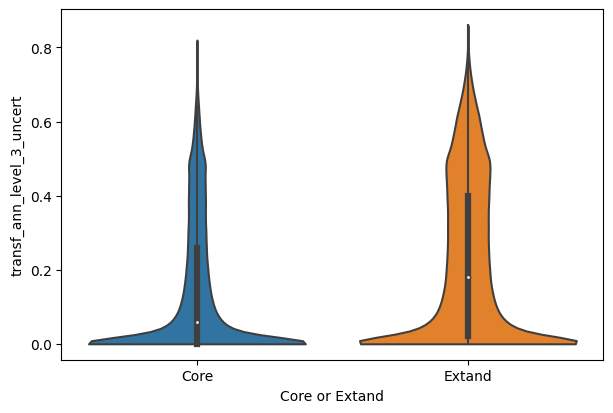

In [1093]:
sc.pl.violin(adata,keys="transf_ann_level_3_uncert",groupby="Core_or_Extand", stripplot=False, inner='box')

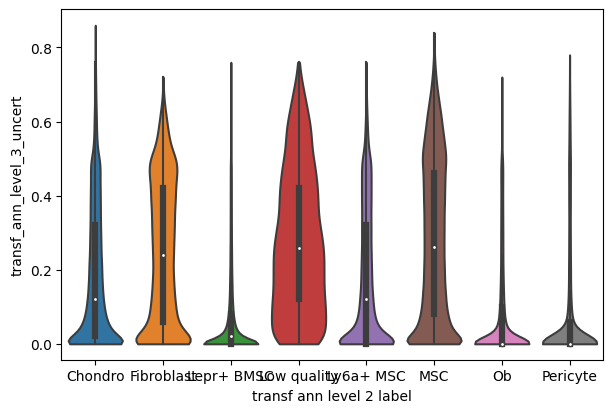

In [1209]:
sc.pl.violin(adata,keys="transf_ann_level_3_uncert",groupby="transf_ann_level_2_label", stripplot=False, inner='box')

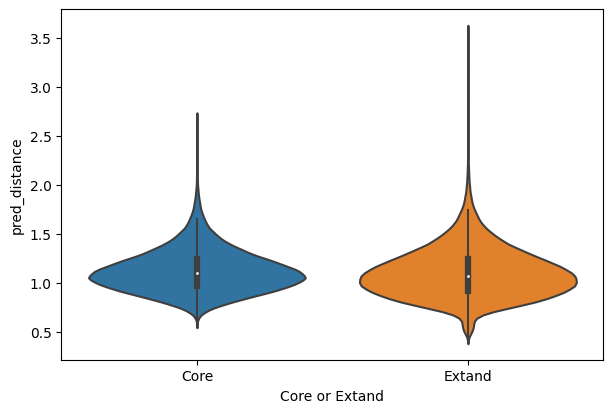

In [1094]:
sc.pl.violin(adata,keys="pred_distance",groupby="Core_or_Extand",stripplot=False, inner='box')

In [1102]:
json_file = open("anntation/config/parameters_wtintegrate.json")
# read json into dictionary
json_str = json_file.read()
parameter_dict = json.loads(json_str)

In [1103]:
batch=parameter_dict["batch_var"]

global_seed = parameter_dict["global_seed"]
target_clusterN = parameter_dict["target_clusterN"]

start_res = parameter_dict["start_res"]
end_res = parameter_dict["end_res"]
step_size = parameter_dict["step_size"]
include_low_res = parameter_dict["include_low_res"]
n_neighbors = parameter_dict["k_param"]

min_cells_valid = parameter_dict["min_cells_valid"]
additional_clustering_suffix = parameter_dict["additional_clustering_suffix"]


In [1104]:
adata.obs["transf_ann_level_3_uncert"][adata.obs["Core_or_Extand"]=="Core"]

Suture2021_Farmer_E17_AAACCTGCAGACTCGC-1_1-0_1_1    0.219973
Suture2021_Farmer_E17_AAACCTGGTGCGGTAA-1_1-0_1_1    0.000000
Suture2021_Farmer_E17_AAACCTGGTGGTCTCG-1_1-0_1_1    0.099916
Suture2021_Farmer_E17_AAACCTGTCACCACCT-1_1-0_1_1    0.159846
Suture2021_Farmer_E17_AAACCTGTCGTTACGA-1_1-0_1_1    0.079952
                                                      ...   
TTTGACTGTATTTCCT-1_5-1-2_1_1                        0.099770
TTTGACTGTTGCATTG-1_5-1-2_1_1                        0.220352
TTTGACTTCTTGGGCG-1_5-1-2_1_1                        0.000000
TTTGGAGCAGCGACAA-1_5-1-2_1_1                        0.000000
TTTGGTTCACTACTTT-1_5-1-2_1_1                        0.239719
Name: transf_ann_level_3_uncert, Length: 272369, dtype: float64

In [1108]:
#define resolution range, hardcoded atm
resolutions = [round(x*step_size,3) for x in range(int(1/step_size)*start_res,int(1/step_size)*end_res+1)]
if(include_low_res):
  low_res_list = [0.001,0.005,0.01,0.05,0.1,0.175,0.25,0.5,0.75]
  #low_res_list = [0.001,0.005,0.0075,0.01,0.05,0.1,0.175,0.25,0.5,0.75,3,5,6,7,15,16,28,37,38,45,50]
  resolutions = low_res_list + resolutions

In [1109]:
full_latent

AnnData object with n_obs × n_vars = 782507 × 15
    obs: 'orig.ident', 'nCount_originalexp', 'nFeature_originalexp', 'Sample', 'Project', 'Limb.Atlas', 'Organ', 'Tissue', 'Tissue.Specific.', 'Stage', 'Gene.type', 'Treatment', 'Age', 'Age.In.Detail.', 'Machine', 'Species', 'Isolation.approach', 'Digestion', 'Enzymes', 'Cre', 'Bone.Forming.Methods', 'Data.Source', 'Related.Assay', 'Origin', 'nCount_RNA', 'nFeature_RNA', 'paper_label', 'coarse_label', 'C2_named', 'C7_named', 'C19_named', 'C36_named', 'C49_named', 'C90_named', 'C137_named', 'transf_ann_level_7_label', 'transf_ann_level_6_label', 'transf_ann_level_5_label', 'transf_ann_level_4_label', 'transf_ann_level_3_label', 'transf_ann_level_2_label', 'transf_ann_level_1_label', 'n_genes', 'most_confident_level', 'most_confident_uncert', 'most_confident_label', 'transf_ann_level_5_uncert', 'transf_ann_level_4_uncert', 'transf_ann_level_3_uncert', 'transf_ann_level_2_uncert', 'transf_ann_level_1_uncert', 'Tissue.Specific', 'Core_or_Ext

In [8]:
leiden_h5ad=sc.read("../../important_processed_data/8.29_reflatent.h5ad")

In [9]:
leidenDfStr=leiden_h5ad.obs.columns.str.startswith("leiden_clusters")

In [11]:
leidenDf=leiden_h5ad.obs.iloc[:,leidenDfStr]

In [12]:

threshold

NameError: name 'np' is not defined

In [1170]:
result_mean

array([0.20588735, 0.21944895, 0.20787449, 0.24805381, 0.22301229,
       0.23351991, 0.36127127, 0.23340652, 0.31188798, 0.343075  ,
       0.2722258 , 0.24998294, 0.24139833, 0.13051082, 0.33809433,
       0.17544506, 0.31034126, 0.26655349, 0.25387747, 0.32087157,
       0.06374693, 0.12505453, 0.12391311, 0.2907562 , 0.52837561,
       0.27857961, 0.14160976, 0.16802667, 0.26179019, 0.26895114,
       0.41809533])

In [1180]:
result.columns

CategoricalIndex(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11',
                  '12', '13', '14', '15', '16', '17', '18', '19', '20', '21',
                  '22', '23', '24', '25', '26', '27', '28', '29', '30', '31'],
                 categories=['0', '1', '2', '3', ..., '28', '29', '30', '31'], ordered=False, dtype='category')

In [1178]:
sum(result_mean>threshold)/len(result_mean)

0.1935483870967742

In [1179]:
result_mean>threshold

array([False, False, False, False, False, False,  True, False, False,
        True, False, False, False, False,  True, False, False, False,
       False,  True, False, False, False, False,  True, False, False,
       False, False, False,  True])

In [1184]:
np.array(result.columns[result_mean>threshold])

array(['7', '10', '15', '20', '25', '31'], dtype=object)

In [29]:
threshold = np.percentile(adata.obs["transf_ann_level_3_uncert"][adata.obs["Core_or_Extand"]=="Core"], 80)
novelCellType={}
for i in leidenDf.columns:
    x=pd.get_dummies(leidenDf[i],drop_first=True)
    result=x*np.array(adata.obs["transf_ann_level_3_uncert"]).reshape(-1,1)
    result[result == 0] = np.nan
    result_mean = np.nanmean(result, axis=0)
    novelType=np.array(result.columns[result_mean>threshold])
    novelCellType[i]=novelType

In [32]:
import pickle


# Serialize and save to a binary file
with open('../result/9.18_novel_celltype/novel_celltype.pickle', 'wb') as file:
    pickle.dump(novelCellType, file)

/home/zhanglab/mambaforge/envs/celloracle/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


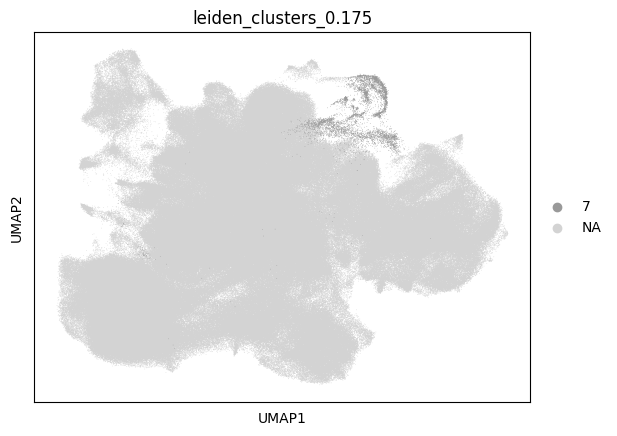

In [1191]:
sc.pl.umap(leiden_h5ad,color="leiden_clusters_0.175",groups="7",palette="Set1",size=1)

/home/zhanglab/mambaforge/envs/celloracle/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


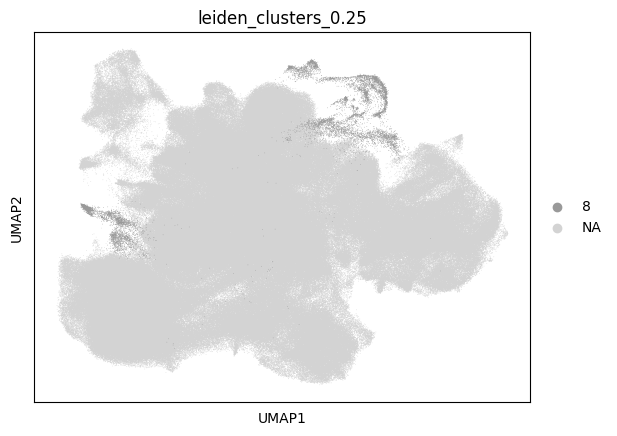

In [1193]:
sc.pl.umap(leiden_h5ad,color="leiden_clusters_0.25",groups="8",palette="Set1",size=1)

/home/zhanglab/mambaforge/envs/celloracle/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


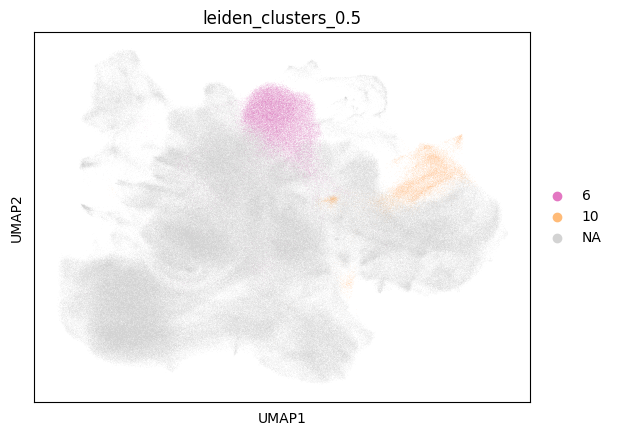

In [1192]:
sc.pl.umap(leiden_h5ad,color="leiden_clusters_0.5",groups=["6","10"])

/home/zhanglab/mambaforge/envs/celloracle/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


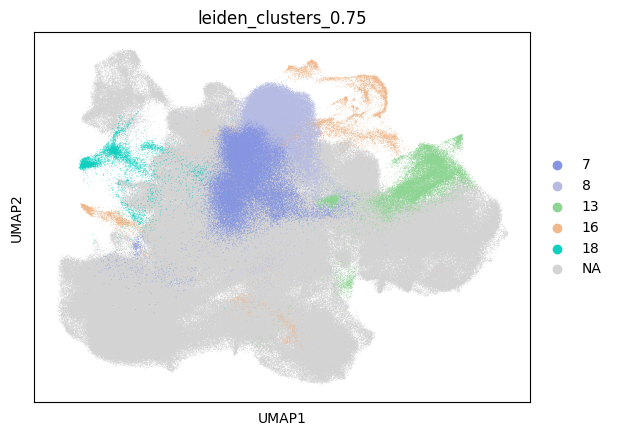

In [1197]:
sc.pl.umap(leiden_h5ad,color="leiden_clusters_0.75",groups=['7', '8', '13', '16', '18'],size=1)

/home/zhanglab/mambaforge/envs/celloracle/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


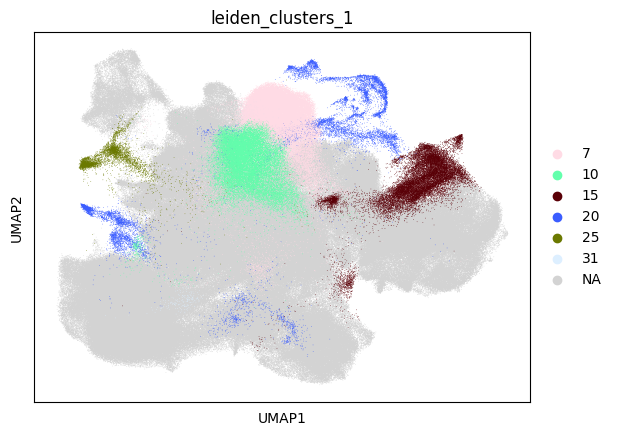

In [1198]:
sc.pl.umap(leiden_h5ad,color="leiden_clusters_1",groups=['7', '10', '15', '20', '25', '31'],size=1)

/home/zhanglab/mambaforge/envs/celloracle/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


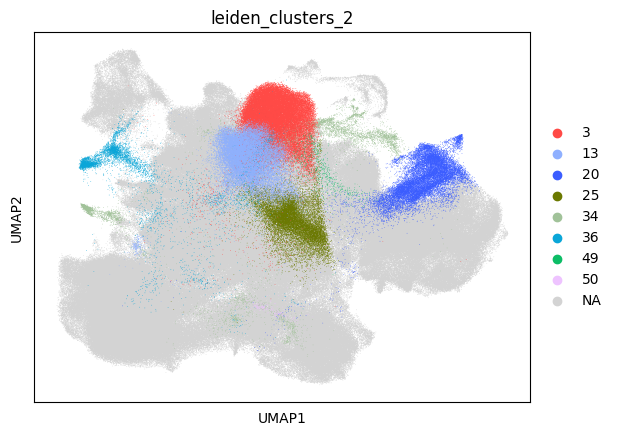

In [1199]:
sc.pl.umap(leiden_h5ad,color="leiden_clusters_2",groups=['3', '13', '20', '25', '34', '36', '49', '50'],size=1)

/home/zhanglab/mambaforge/envs/celloracle/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


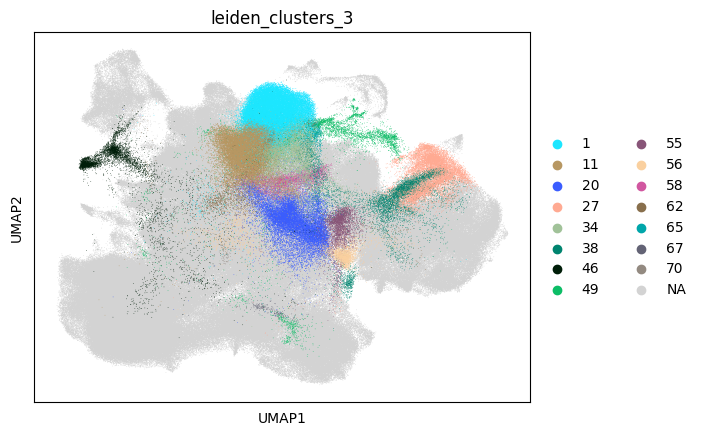

In [1200]:
sc.pl.umap(leiden_h5ad,color="leiden_clusters_3",groups=['1', '11', '20', '27', '34', '38', '46', '49', '55', '56', '58',
        '62', '65', '67', '70'],size=1)

/home/zhanglab/mambaforge/envs/celloracle/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


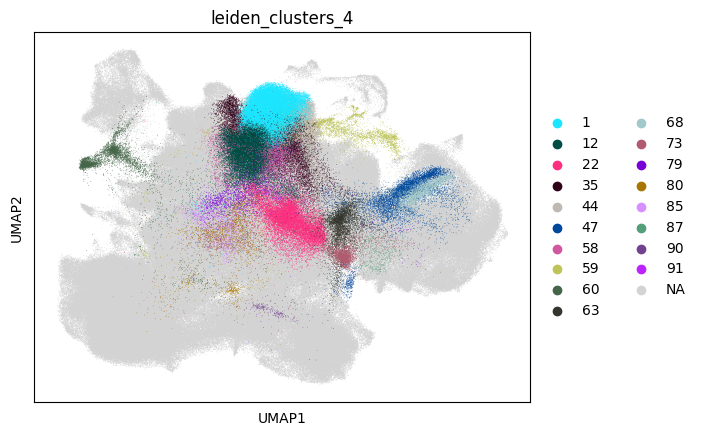

In [1201]:
sc.pl.umap(leiden_h5ad,color="leiden_clusters_4",groups=['1', '12', '22', '35', '44', '47', '58', '59', '60', '63', '68',
        '73', '79', '80', '85', '87', '90', '91'],size=1)

/home/zhanglab/mambaforge/envs/celloracle/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


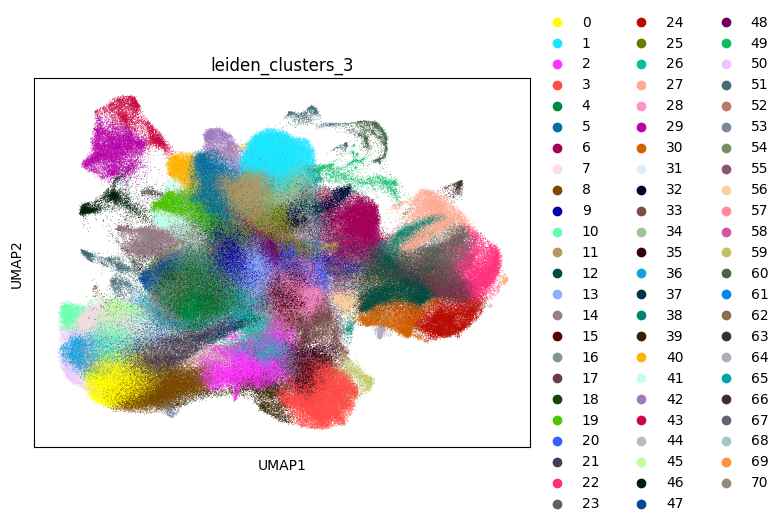

In [1204]:
sc.pl.umap(leiden_h5ad,color="leiden_clusters_3",size=1)

/home/zhanglab/mambaforge/envs/celloracle/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


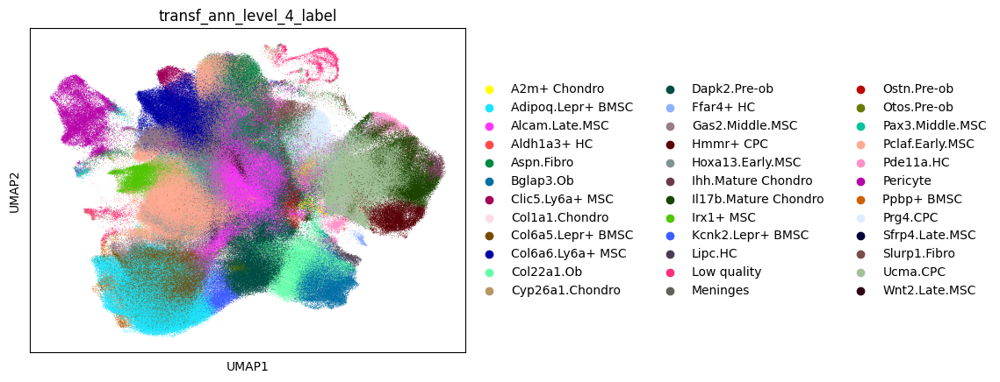

In [1208]:
sc.pl.umap(adata,color=["transf_ann_level_4_label"],size=1)

/home/zhanglab/mambaforge/envs/celloracle/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


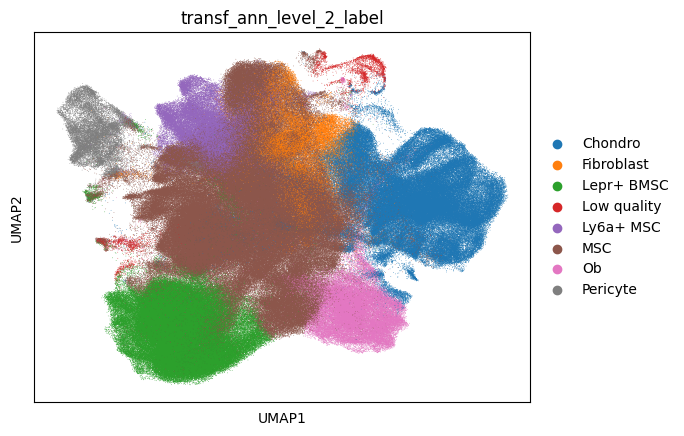

In [1210]:
sc.pl.umap(adata,color=["transf_ann_level_2_label"],size=1)

/home/zhanglab/mambaforge/envs/celloracle/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


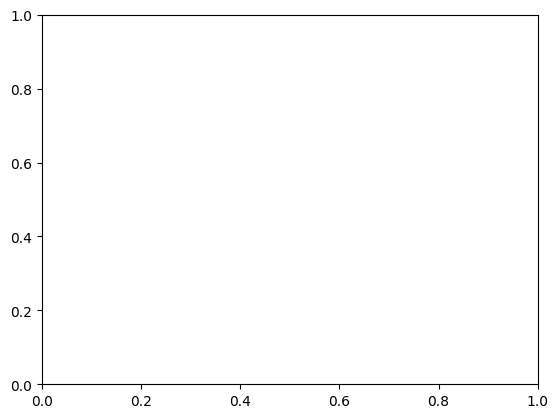

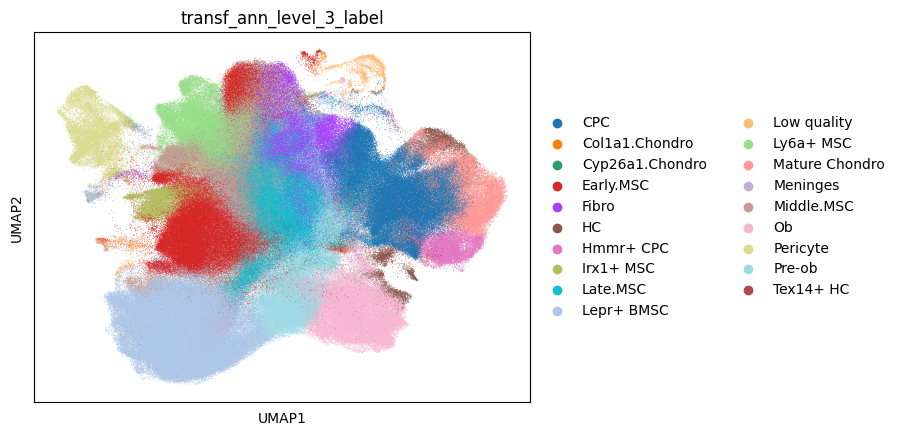

In [1241]:
sc.pl.umap(adata,color=["transf_ann_level_3_label"],size=1)

/home/zhanglab/mambaforge/envs/celloracle/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


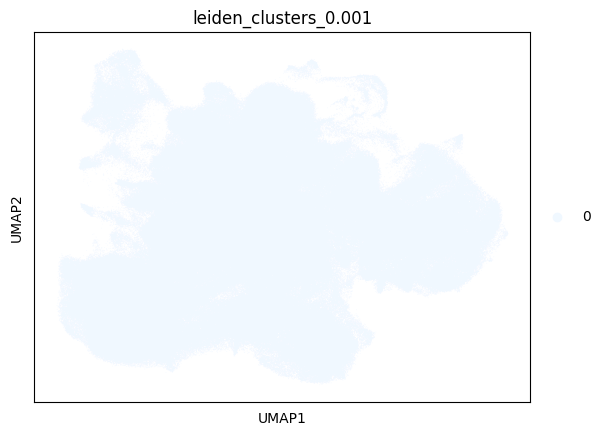

/home/zhanglab/mambaforge/envs/celloracle/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


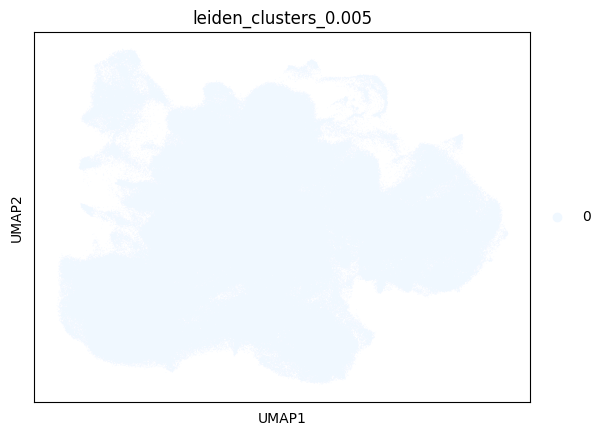

/home/zhanglab/mambaforge/envs/celloracle/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


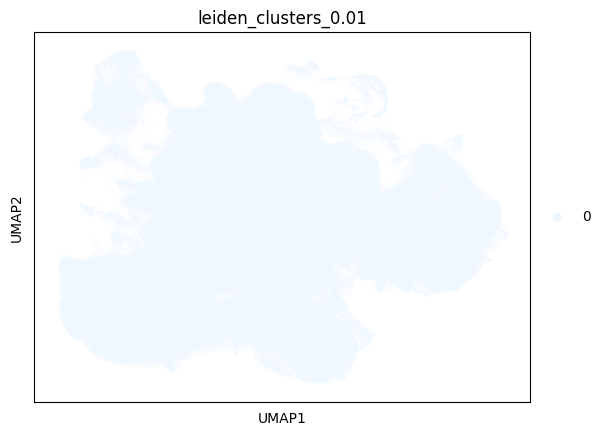

/home/zhanglab/mambaforge/envs/celloracle/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


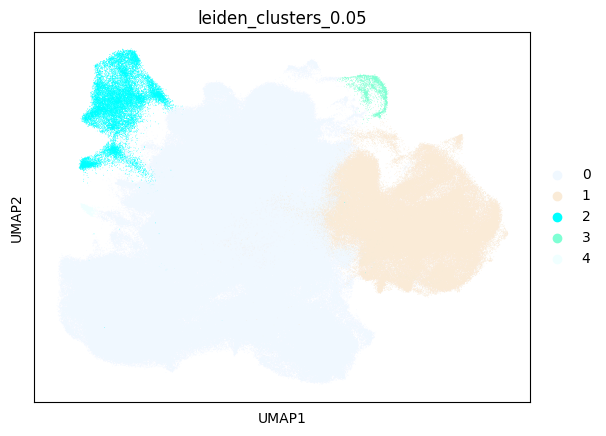

/home/zhanglab/mambaforge/envs/celloracle/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


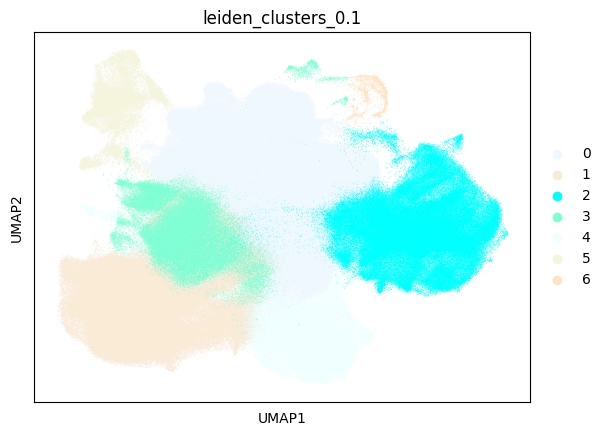

/home/zhanglab/mambaforge/envs/celloracle/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


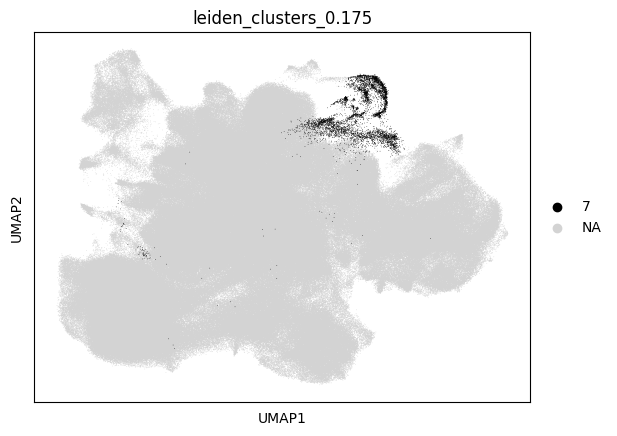

/home/zhanglab/mambaforge/envs/celloracle/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


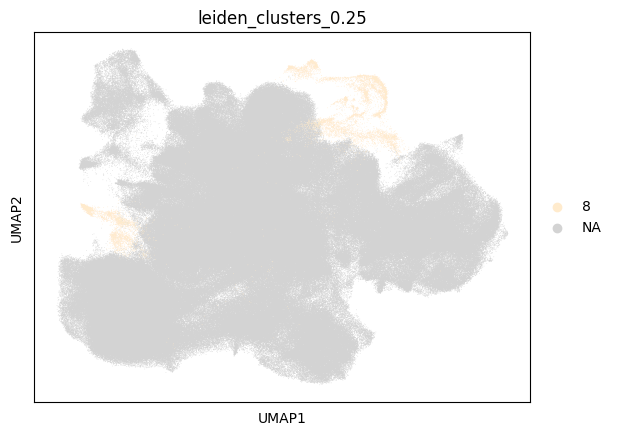

/home/zhanglab/mambaforge/envs/celloracle/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


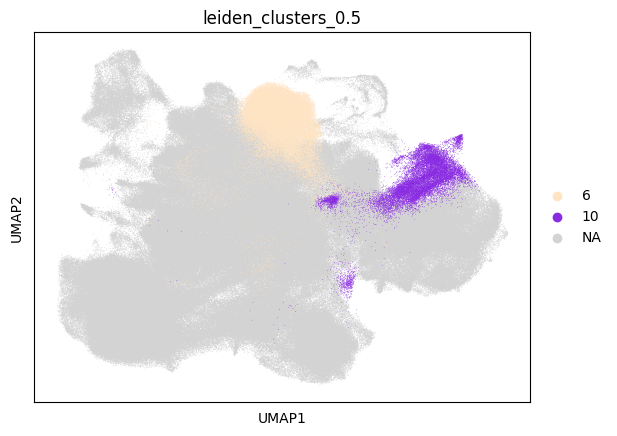

/home/zhanglab/mambaforge/envs/celloracle/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


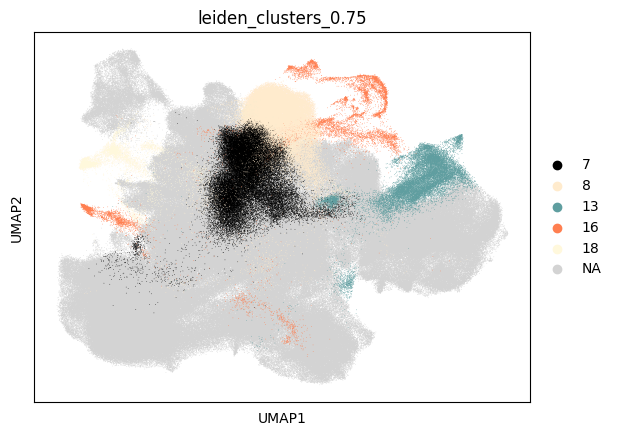

/home/zhanglab/mambaforge/envs/celloracle/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


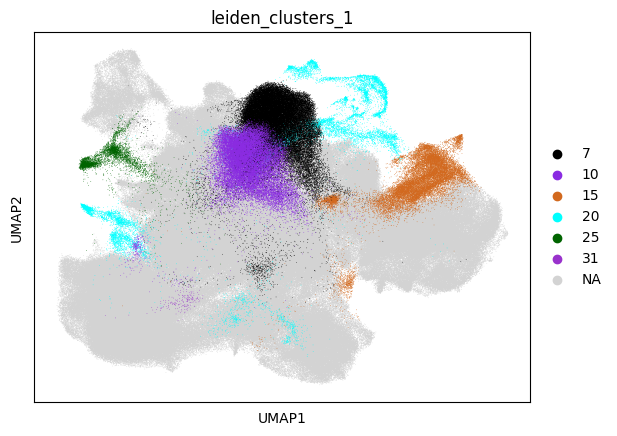

/home/zhanglab/mambaforge/envs/celloracle/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


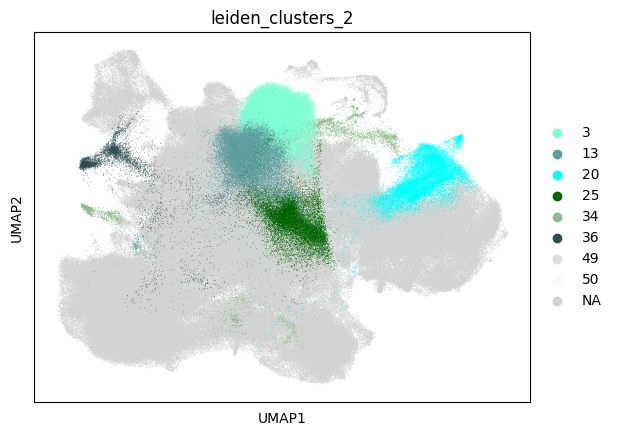

/home/zhanglab/mambaforge/envs/celloracle/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


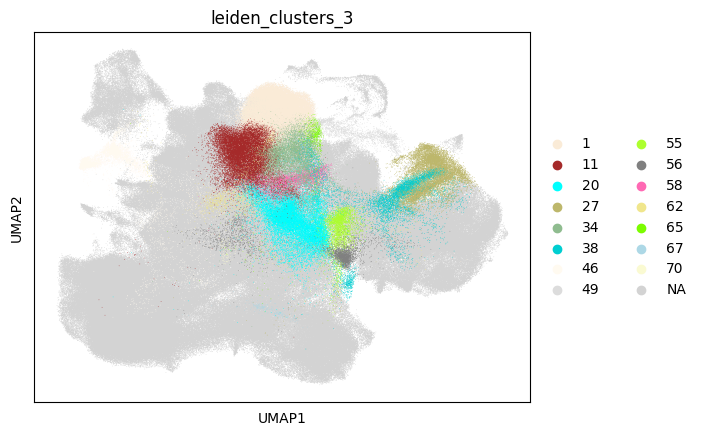

ValueError: new categories must not include old categories: {'#d3d3d3ff'}

In [1237]:
for i in novelCellType.keys():
    sc.pl.umap(leiden_h5ad,color=i,groups=novelCellType[i].tolist(),size=1,
               palette=list(mlt.colors.CSS4_COLORS.values()),
               save=f"{i}_in_full.pdf")


In [1221]:
novelCellType.keys()

dict_keys(['leiden_clusters_0.001', 'leiden_clusters_0.005', 'leiden_clusters_0.01', 'leiden_clusters_0.05', 'leiden_clusters_0.1', 'leiden_clusters_0.175', 'leiden_clusters_0.25', 'leiden_clusters_0.5', 'leiden_clusters_0.75', 'leiden_clusters_1', 'leiden_clusters_2', 'leiden_clusters_3', 'leiden_clusters_4', 'leiden_clusters_5', 'leiden_clusters_6', 'leiden_clusters_7', 'leiden_clusters_8', 'leiden_clusters_9', 'leiden_clusters_10', 'leiden_clusters_11', 'leiden_clusters_12', 'leiden_clusters_13', 'leiden_clusters_14', 'leiden_clusters_15'])

In [ ]:
sc.pl.umap(leiden_h5ad,color="leiden_clusters_0.175",groups="7",palette="Set1")

In [1238]:
leidenDf.index

Index(['Suture2021_Farmer_E17_AAACCTGCAGACTCGC-1_1-0_1_1',
       'Suture2021_Farmer_E17_AAACCTGGTGCGGTAA-1_1-0_1_1',
       'Suture2021_Farmer_E17_AAACCTGGTGGTCTCG-1_1-0_1_1',
       'Suture2021_Farmer_E17_AAACCTGTCACCACCT-1_1-0_1_1',
       'Suture2021_Farmer_E17_AAACCTGTCGTTACGA-1_1-0_1_1',
       'Suture2021_Farmer_E17_AAAGATGAGGGAACGG-1_1-0_1_1',
       'Suture2021_Farmer_E17_AAAGTAGAGGAATGGA-1_1-0_1_1',
       'Suture2021_Farmer_E17_AAAGTAGCAGCTATTG-1_1-0_1_1',
       'Suture2021_Farmer_E17_AAAGTAGTCAATCACG-1_1-0_1_1',
       'Suture2021_Farmer_E17_AAAGTAGTCGGAGCAA-1_1-0_1_1',
       ...
       'TTTGGTTTCTCGCGTT-1_8', 'TTTGGTTTCTCTGAGA-1_8', 'TTTGTTGAGATAGTCA-1_8',
       'TTTGTTGAGCGGTAGT-1_8', 'TTTGTTGAGGAATGTT-1_8', 'TTTGTTGAGGTGATAT-1_8',
       'TTTGTTGAGTCTTCCC-1_8', 'TTTGTTGGTCCACACG-1_8', 'TTTGTTGTCACTACGA-1_8',
       'TTTGTTGTCCGGGACT-1_8'],
      dtype='object', length=781397)

In [1239]:
chondroSub1=leidenDf.index[leidenDf['leiden_clusters_0.5']=="10"]

In [1242]:
adata

AnnData object with n_obs × n_vars = 781397 × 20664
    obs: 'Sample', 'Project', 'Core Dataset', 'Limb Atlas', 'Cranial Atlas', 'Organ', 'Tissue', 'Tissue(Specific)', 'Stage', 'Gene type', 'Treatment', 'Age', 'Age(In Detail)', 'Machine', 'Species', 'Isolation approach', 'Digestion', 'Enzymes', 'Cre', 'Bone Forming Methods', 'Data Source', 'Related Assay', 'Cell Count After QC', 'Origin', 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'paper_label', 'coarse_label', 'scDblFinder_class', 'short_id', 'nCount_originalexp', 'nFeature_originalexp', 'n_genes', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'new_totals_log', 'batch', 'log10_total_counts', 'n_genes_detected', 'mito_frac', 'ribo_frac', 'compl', 'transf_ann_level_7_label', 'transf_ann_level_6_label', 'transf_ann_level_5_label', 'transf_ann_level_4_label', 'transf_ann_level_

In [1244]:
adata.obs["anno_update_level_3"]=adata.obs["transf_ann_level_3_label"]

In [1251]:
adata.obs["anno_update_level_3"]=adata.obs["anno_update_level_3"].astype("str")

In [1252]:
adata.obs["anno_update_level_3"][chondroSub1]="Chondro_novel"

/tmp/ipykernel_1805584/646992306.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  adata.obs["anno_update_level_3"][chondroSub1]="Chondro_novel"


In [1258]:
adata.obs["anno_update_level_3"][chondroSub1]

Suture2021_Farmer_E15_ATTACTCCAAGGACAC-1_2-0_1_1    Chondro_novel
Suture2021_Farmer_E15_CCACCTAGTAGCAAAT-1_2-0_1_1    Chondro_novel
Suture2021_Farmer_E15_CTAATGGTCGCGTTTC-1_2-0_1_1    Chondro_novel
SOXC_WT_E17.5_CTGCTCACATATCTGG-1_10-0_1_1           Chondro_novel
CalvariaP4_Ayturk_CATCCACTCCAGTATG-1-0_1_1          Chondro_novel
                                                        ...      
GTCATGATCTTACGTT-1_6                                Chondro_novel
TACACCCAGCGCCGTT-1_6                                Chondro_novel
TTGGGATTCGCCTATC-1_6                                Chondro_novel
AAGCATCTCGTTCCCA-1_8                                Chondro_novel
ATTCGTTGTTAGGCTT-1_8                                Chondro_novel
Name: anno_update_level_3, Length: 18026, dtype: category
Categories (20, object): ['CPC', 'Chondro_novel', 'Col1a1.Chondro', 'Cyp26a1.Chondro', ..., 'Ob', 'Pericyte', 'Pre-ob', 'Tex14+ HC']

In [1260]:
leiden_h5ad.obs["anno_update_level_3"]=adata.obs["anno_update_level_3"]

/home/zhanglab/mambaforge/envs/celloracle/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


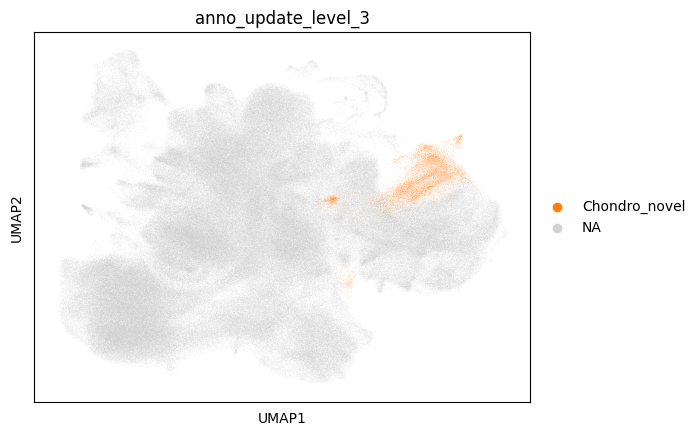

In [1262]:
sc.pl.umap(leiden_h5ad,color="anno_update_level_3",groups="Chondro_novel")

In [1267]:
leiden_h5ad.obs["transf_ann_level_3_uncert"]=adata.obs['transf_ann_level_3_uncert']

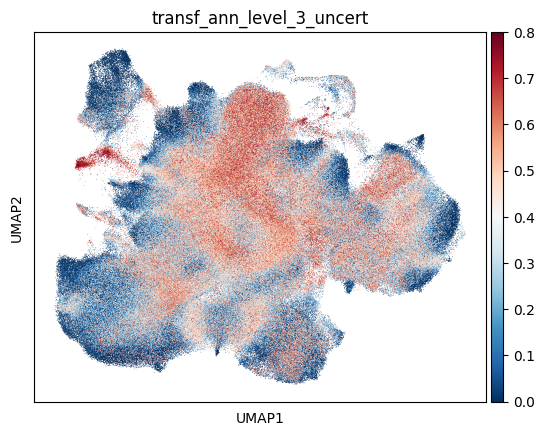

In [1278]:
sc.pl.umap(leiden_h5ad,color="transf_ann_level_3_uncert",vmax=0.8,cmap="RdBu_r",size=1)

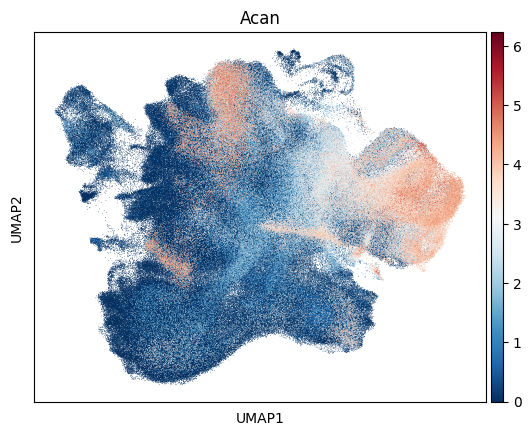

In [1287]:
sc.pl.umap(adata,color="Acan",use_raw=False,cmap="RdBu_r",size=1)

In [1289]:
novelSub2=leidenDf.index[leidenDf['leiden_clusters_0.5']=="6"]
adata.obs["anno_update_level_3"]=adata.obs["anno_update_level_3"].astype("str")
adata.obs["anno_update_level_3"][novelSub2]="Mes_novel"

/tmp/ipykernel_1805584/2890507664.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  adata.obs["anno_update_level_3"][novelSub2]="Mes_novel"


In [1304]:
adata.obs["anno_update_level_3"][chondroSub1]

Suture2021_Farmer_E15_ATTACTCCAAGGACAC-1_2-0_1_1    Chondro_novel
Suture2021_Farmer_E15_CCACCTAGTAGCAAAT-1_2-0_1_1    Chondro_novel
Suture2021_Farmer_E15_CTAATGGTCGCGTTTC-1_2-0_1_1    Chondro_novel
SOXC_WT_E17.5_CTGCTCACATATCTGG-1_10-0_1_1           Chondro_novel
CalvariaP4_Ayturk_CATCCACTCCAGTATG-1-0_1_1          Chondro_novel
                                                        ...      
GTCATGATCTTACGTT-1_6                                Chondro_novel
TACACCCAGCGCCGTT-1_6                                Chondro_novel
TTGGGATTCGCCTATC-1_6                                Chondro_novel
AAGCATCTCGTTCCCA-1_8                                Chondro_novel
ATTCGTTGTTAGGCTT-1_8                                Chondro_novel
Name: anno_update_level_3, Length: 18026, dtype: category
Categories (21, object): ['CPC', 'Chondro_novel', 'Col1a1.Chondro', 'Cyp26a1.Chondro', ..., 'Ob', 'Pericyte', 'Pre-ob', 'Tex14+ HC']

/home/zhanglab/mambaforge/envs/celloracle/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


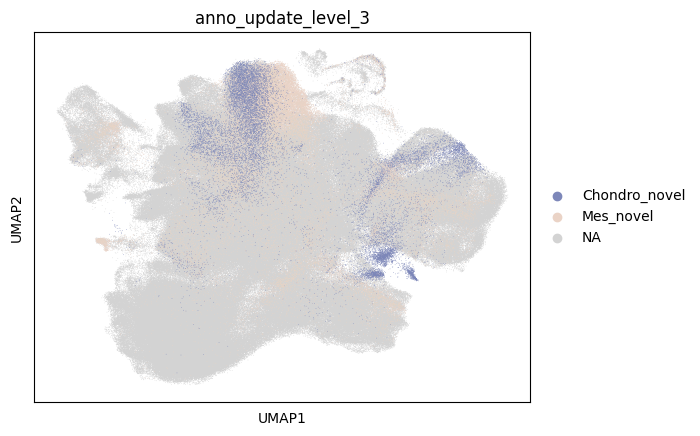

In [1292]:
sc.pl.umap(adata,color="anno_update_level_3",groups=["Chondro_novel","Mes_novel"],size=1)

In [1303]:
adata.obs.loc[novelSub2,:].groupby("Project").size().sort_values(ascending=False)

Project
SkeletalMuscle_Julien           14737
RibRegeneraton_Serowoky          6644
CranioRepairP75_Xu               4069
HeterotopicActin_Mundy           2311
LimbImplant_VesPrey              2107
                                ...  
ChondroOsteo_Long                   1
BmscChondro_Long                    0
BmscMyelofibrosis_Leimkühler        0
SSC2021_Ambrosi                     0
BMSCNiche2019_Baccin                0
Length: 65, dtype: int64

In [1305]:
adata.obs.loc[chondroSub1,:].groupby("Project").size().sort_values(ascending=False)

Project
Septoclasts_Kishor     10148
BmscEndosteal_Ono       1379
ChondroOsteo_Long        908
LimbImplant_VesPrey      790
Metaphysis_Yang          718
                       ...  
Mandible2020_Chai          0
LimbSSC_Chan               0
CalvariaHuman_He           0
BmscEpi_Kanazawa           0
sagittal_Holmes            0
Length: 65, dtype: int64

In [33]:
adata.obsm["UMAP2"]=leiden_h5ad.obsm["X_umap"]

In [35]:
leiden_h5ad

AnnData object with n_obs × n_vars = 781397 × 15
    obs: 'Sample', 'Project', 'Core Dataset', 'Limb Atlas', 'Cranial Atlas', 'Organ', 'Tissue', 'Tissue(Specific)', 'Stage', 'Gene type', 'Treatment', 'Age', 'Age(In Detail)', 'Machine', 'Species', 'Isolation approach', 'Digestion', 'Enzymes', 'Cre', 'Bone Forming Methods', 'Data Source', 'Related Assay', 'Cell Count After QC', 'Origin', 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'paper_label', 'coarse_label', 'scDblFinder_class', 'short_id', 'nCount_originalexp', 'nFeature_originalexp', 'n_genes', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'new_totals_log', 'batch', '_scvi_batch', 'scanvi_label', '_scvi_labels', 'leiden', 'pred_anno', 'reject', 'pred_anno7', 'pred_anno19', 'pred_anno36', 'pred_anno49', 'pred_anno90', 'leiden_clusters_0.001', 'leiden_clusters_0.005', 'leide

In [36]:
adata.obsm["scANVI_2"]=leiden_h5ad.X

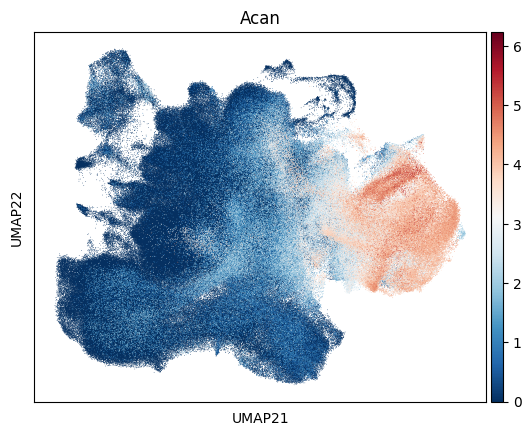

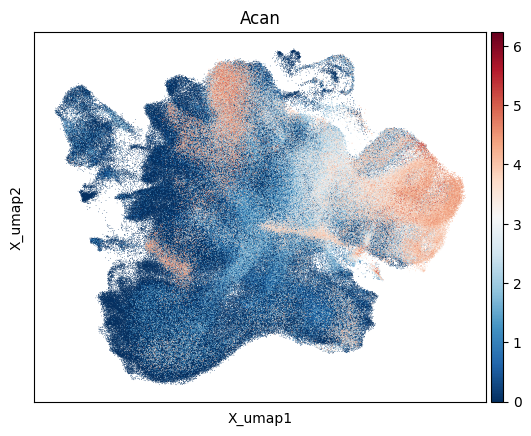

In [39]:
sc.pl.embedding(adata,color="Acan",use_raw=False,cmap="RdBu_r",size=1,basis="UMAP2")
sc.pl.embedding(adata,color="Acan",use_raw=False,cmap="RdBu_r",size=1,basis="X_umap")

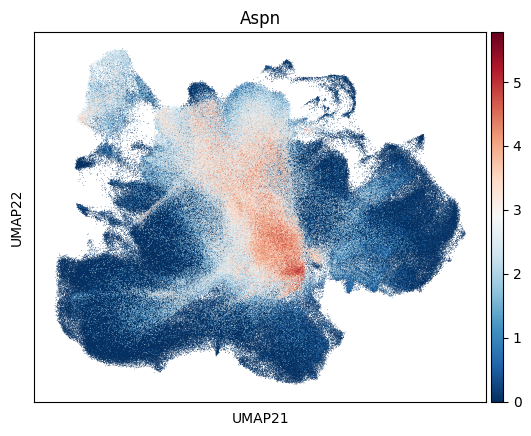

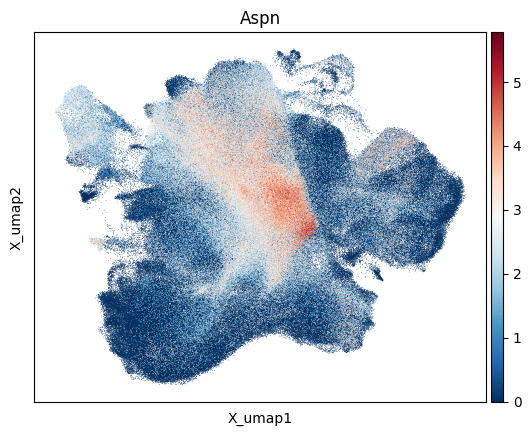

In [1308]:
sc.pl.embedding(adata,color="Aspn",use_raw=False,cmap="RdBu_r",size=1,basis="UMAP2")
sc.pl.embedding(adata,color="Aspn",use_raw=False,cmap="RdBu_r",size=1,basis="X_umap")

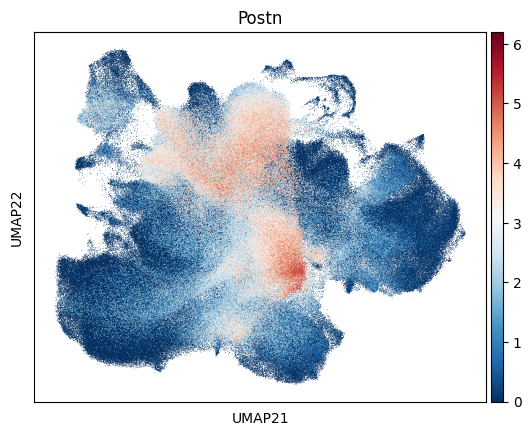

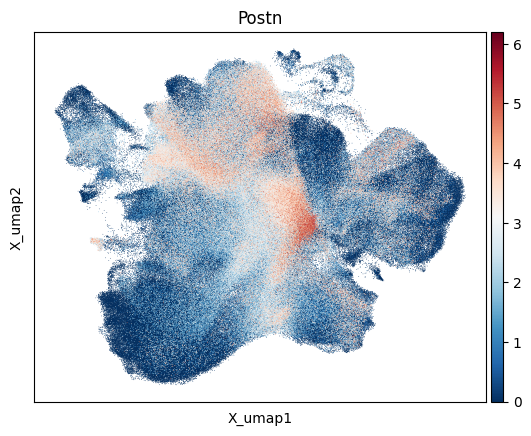

In [1309]:
sc.pl.embedding(adata,color="Postn",use_raw=False,cmap="RdBu_r",size=1,basis="UMAP2")
sc.pl.embedding(adata,color="Postn",use_raw=False,cmap="RdBu_r",size=1,basis="X_umap")

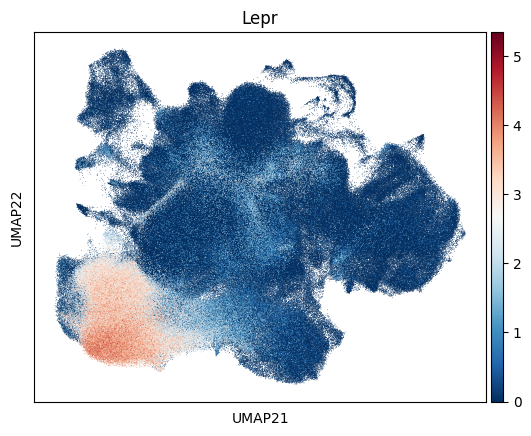

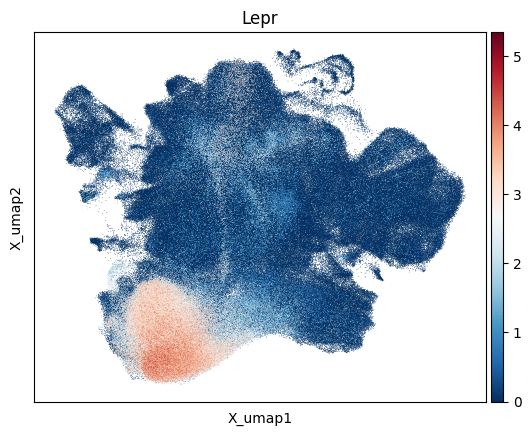

In [1310]:
sc.pl.embedding(adata,color="Lepr",use_raw=False,cmap="RdBu_r",size=1,basis="UMAP2")
sc.pl.embedding(adata,color="Lepr",use_raw=False,cmap="RdBu_r",size=1,basis="X_umap")

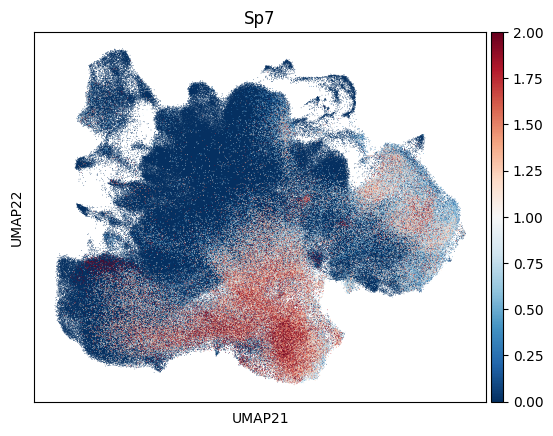

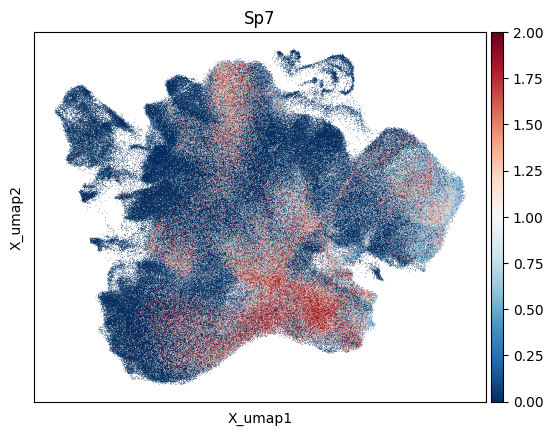

In [1312]:
sc.pl.embedding(adata,color="Sp7",use_raw=False,cmap="RdBu_r",size=1,basis="UMAP2",vmax=2)
sc.pl.embedding(adata,color="Sp7",use_raw=False,cmap="RdBu_r",size=1,basis="X_umap",vmax=2)

In [1283]:
adata.var

,features,n_cells,n_cells_by_counts,mean_counts,log1p_mean_counts,pct_dropout_by_counts,total_counts,log1p_total_counts,highly_variable,means,dispersions,dispersions_norm,highly_variable_nbatches,highly_variable_intersection
0610005C13Rik,0610005C13Rik,1013,1013,0.001473,0.001472,99.870360,1150.701752,7.048996,False,0.000801,0.444949,0.482063,4,False
0610007N19Rik,0610007N19Rik,38784,38784,0.237821,0.213353,95.036582,185832.556586,12.132607,False,0.050481,0.020466,0.004835,0,False
0610007P14Rik,0610007P14Rik,119311,119311,0.294429,0.258069,84.731065,230065.701080,12.346125,False,0.191254,0.511206,0.207748,4,False
0610009B22Rik,0610009B22Rik,203016,203016,0.393634,0.331915,74.018841,307584.250095,12.636508,False,0.202411,0.759663,-0.732565,2,False
0610009D07Rik,0610009D07Rik,33962,33962,0.099070,0.094464,95.653682,77412.849167,11.256921,False,0.040898,0.018627,-0.008529,0,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Qki,Qki,18861,18861,0.045411,0.044410,97.586246,35484.000000,10.476865,False,0.022556,0.026802,0.035607,0,False
Gm31160,Gm31160,2413,2413,0.003426,0.003420,99.691194,2677.000000,7.892826,False,0.001045,0.029792,-0.042823,0,False
Tesl2,Tesl2,14726,14726,0.030916,0.030448,98.115427,24158.000000,10.092412,False,0.011643,0.033135,0.096044,3,False
Nlgn4l,Nlgn4l,2765,2765,0.004237,0.004228,99.646147,3311.000000,8.105308,False,0.002078,0.038340,0.115022,2,False


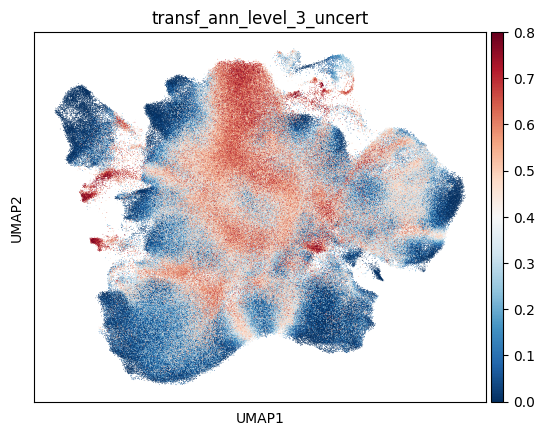

In [1276]:
sc.pl.umap(adata,color="transf_ann_level_3_uncert",vmax=0.8,cmap="RdBu_r",size=1)

/home/zhanglab/mambaforge/envs/celloracle/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


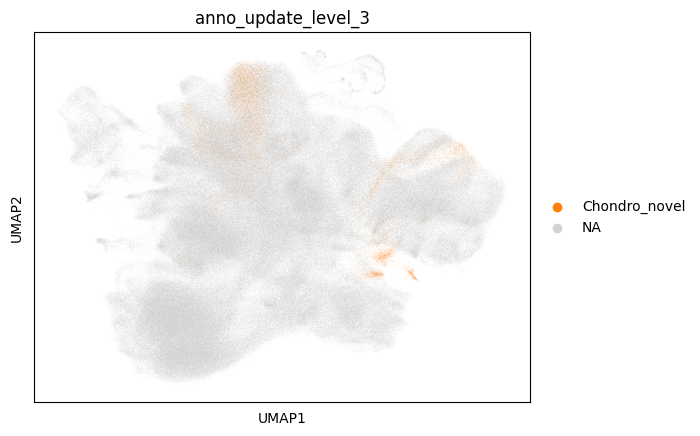

In [1265]:
sc.pl.umap(adata,color="anno_update_level_3",groups="Chondro_novel")

In [34]:
adata.obs.to_csv("../../important_processed_data/9.20_intergrate_meta.csv")

In [37]:
chondroSub1=leidenDf.index[leidenDf['leiden_clusters_0.5']=="10"]

/home/zhanglab/mambaforge/envs/celloracle/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


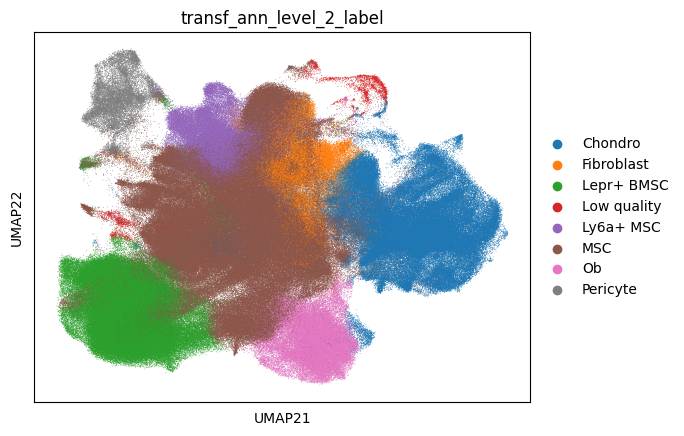

In [61]:
sc.pl.embedding(adata,color="transf_ann_level_2_label",use_raw=False,size=1,basis="UMAP2")

In [ ]:
## Use New em

In [60]:
adata.obs["transf_ann_level_7_label"]=labels["C137_named"]
adata.obs["transf_ann_level_6_label"]=labels["C90_named"]
adata.obs["transf_ann_level_5_label"]=labels["C49_named"]
adata.obs["transf_ann_level_4_label"]=labels["C36_named"]
adata.obs["transf_ann_level_3_label"]=labels["C19_named"]
adata.obs["transf_ann_level_2_label"]=labels["C7_named"]
adata.obs["transf_ann_level_1_label"]=labels["C2_named"]

In [63]:
uncert

,C2_named,C7_named,C19_named,C36_named,C49_named,C90_named,C137_named
Suture2021_Farmer_E17_AAACCTGCAGACTCGC-1_1-0_1_1,0,0.240018,0.280011,0.280011,0.360009,0.360009,0.559998
Suture2021_Farmer_E17_AAACCTGGTGCGGTAA-1_1-0_1_1,0.0,0.019987,0.019987,0.019987,0.079946,0.079946,0.43996
Suture2021_Farmer_E17_AAACCTGGTGGTCTCG-1_1-0_1_1,0.039997,0.039997,0.039997,0.039997,0.419992,0.419992,0.419992
Suture2021_Farmer_E17_AAACCTGTCACCACCT-1_1-0_1_1,0.160057,0.160057,0.160057,0.24002,0.599917,0.599917,0.599917
Suture2021_Farmer_E17_AAACCTGTCGTTACGA-1_1-0_1_1,0.0,0.179976,0.179976,0.539954,0.559957,0.680013,0.680013
...,...,...,...,...,...,...,...
TTTGTTGAGGTGATAT-1_8,0.0,0.0,0.0,0.0,0.09999,0.419988,0.499987
TTTGTTGAGTCTTCCC-1_8,0.119972,0.139955,0.139955,0.4601,0.660053,0.679855,0.679855
TTTGTTGGTCCACACG-1_8,0.0,0.07998,0.07998,0.07998,0.179967,0.639922,0.739924
TTTGTTGTCACTACGA-1_8,0.0,0.039991,0.259987,0.259987,0.499953,0.499953,0.499953


In [64]:
adata.obs["transf_ann_level_7_uncert"]=uncert["C137_named"]
adata.obs["transf_ann_level_6_uncert"]=uncert["C90_named"]
adata.obs["transf_ann_level_5_uncert"]=uncert["C49_named"]
adata.obs["transf_ann_level_4_uncert"]=uncert["C36_named"]
adata.obs["transf_ann_level_3_uncert"]=uncert["C19_named"]
adata.obs["transf_ann_level_2_uncert"]=uncert["C7_named"]
adata.obs["transf_ann_level_1_uncert"]=uncert["C2_named"]

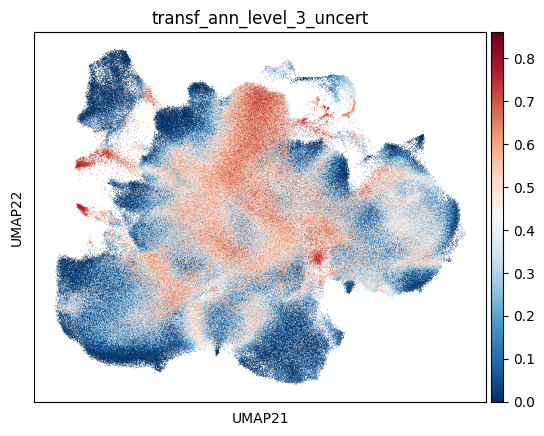

In [67]:
sc.pl.embedding(adata,color="transf_ann_level_3_uncert",use_raw=False,size=1,basis="UMAP2",cmap="RdBu_r")

/home/zhanglab/mambaforge/envs/celloracle/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


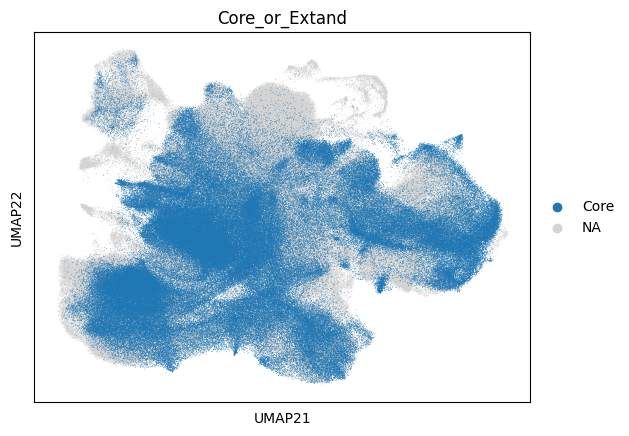

In [83]:
sc.pl.embedding(adata,color="Core_or_Extand",basis="UMAP2",groups="Core",size=1)

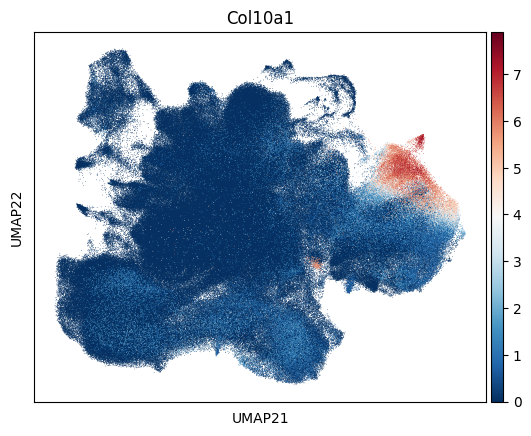

In [79]:
sc.pl.embedding(adata,color="Col10a1",use_raw=False,size=1,basis="UMAP2",cmap="RdBu_r")

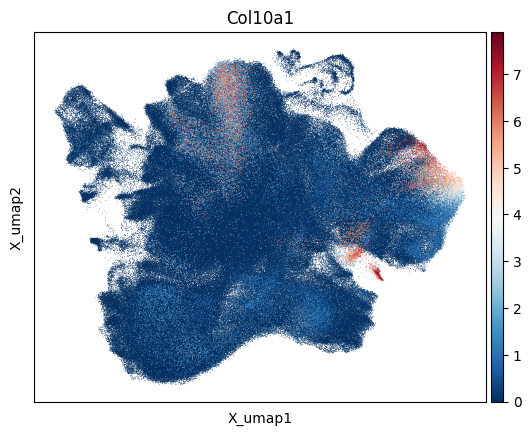

In [81]:
sc.pl.embedding(adata,color="Col10a1",use_raw=False,size=1,basis="X_umap",cmap="RdBu_r")

In [71]:
threshold = np.percentile(adata.obs["transf_ann_level_3_uncert"][adata.obs["Core_or_Extand"]=="Core"], 80)
novelCellType2={}
for i in leidenDf.columns:
    print("Working on "+i)
    x=pd.get_dummies(leidenDf[i],drop_first=True)
    result=x*np.array(adata.obs["transf_ann_level_3_uncert"]).reshape(-1,1)
    result[result == 0] = np.nan
    result_mean = np.nanmean(result, axis=0)
    novelType=np.array(result.columns[result_mean>threshold])
    novelCellType2[i]=novelType

Working on leiden_clusters_0.001
Working on leiden_clusters_0.005
Working on leiden_clusters_0.01
Working on leiden_clusters_0.05
Working on leiden_clusters_0.1
Working on leiden_clusters_0.175
Working on leiden_clusters_0.25
Working on leiden_clusters_0.5
Working on leiden_clusters_0.75
Working on leiden_clusters_1
Working on leiden_clusters_2
Working on leiden_clusters_3
Working on leiden_clusters_4
Working on leiden_clusters_5
Working on leiden_clusters_6
Working on leiden_clusters_7
Working on leiden_clusters_8
Working on leiden_clusters_9
Working on leiden_clusters_10
Working on leiden_clusters_11
Working on leiden_clusters_12
Working on leiden_clusters_13
Working on leiden_clusters_14
Working on leiden_clusters_15


/home/zhanglab/mambaforge/envs/celloracle/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


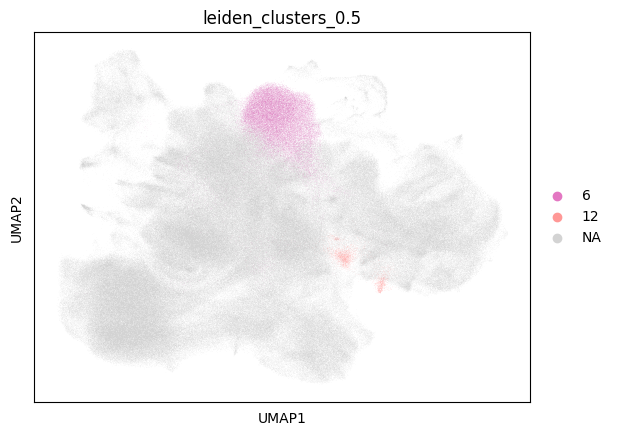

In [73]:
sc.pl.umap(leiden_h5ad,color="leiden_clusters_0.5",groups=["6","12"])

/home/zhanglab/mambaforge/envs/celloracle/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


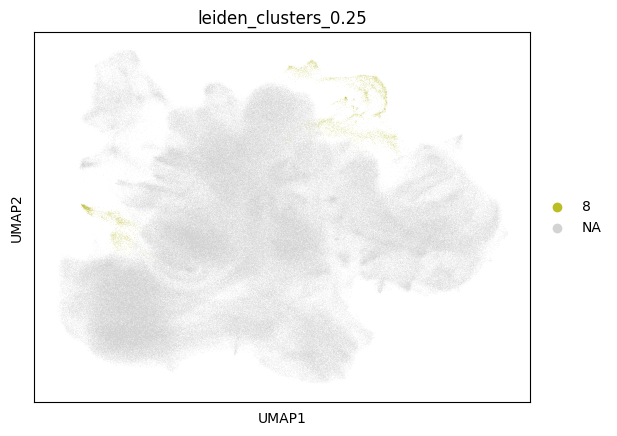

In [75]:
sc.pl.umap(leiden_h5ad,color="leiden_clusters_0.25",groups=["8"])

/home/zhanglab/mambaforge/envs/celloracle/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


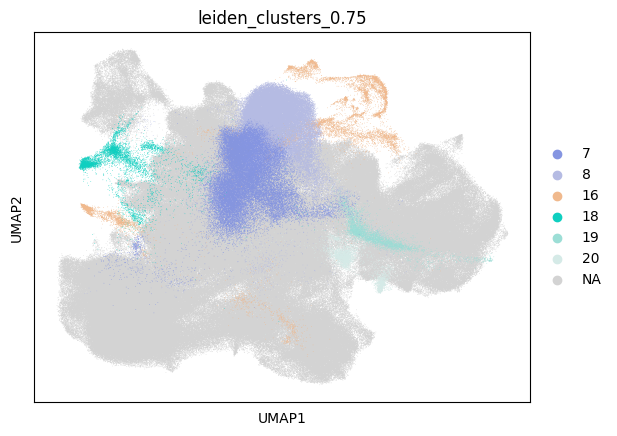

In [84]:
sc.pl.umap(leiden_h5ad,color="leiden_clusters_0.75",groups=['7', '8', '16', '18', '19', '20'],size=1)

/home/zhanglab/mambaforge/envs/celloracle/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


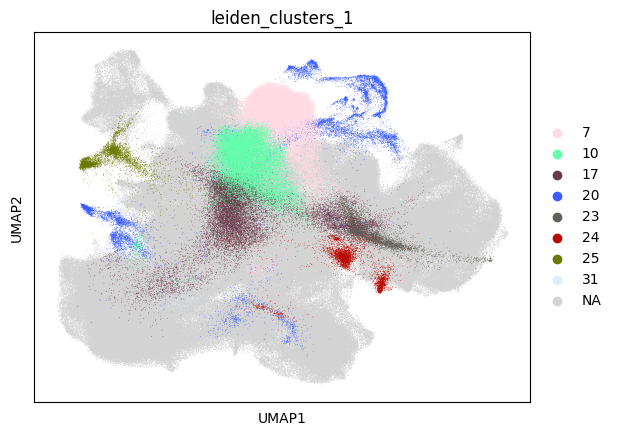

In [77]:
sc.pl.umap(leiden_h5ad,color="leiden_clusters_1",groups=['7', '10', '17', '20', '23', '24', '25', '31'],size=1)

/home/zhanglab/mambaforge/envs/celloracle/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


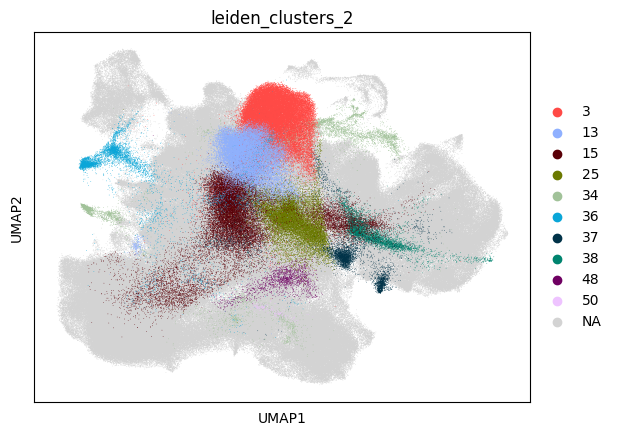

In [78]:
sc.pl.umap(leiden_h5ad,color="leiden_clusters_2",groups=['3', '13', '15', '25', '34', '36', '37', '38', '48', '50'],size=1)

In [87]:
threshold = np.percentile(adata.obs["transf_ann_level_3_uncert"][adata.obs["Core_or_Extand"]=="Core"], 75)
novelCellType3={}
for i in ['leiden_clusters_0.001', 'leiden_clusters_0.005',
       'leiden_clusters_0.01', 'leiden_clusters_0.05', 'leiden_clusters_0.1',
       'leiden_clusters_0.175', 'leiden_clusters_0.25', 'leiden_clusters_0.5',
       'leiden_clusters_0.75', 'leiden_clusters_1', 'leiden_clusters_2',
       'leiden_clusters_3', 'leiden_clusters_4']:
    print("Working on "+i)
    x=pd.get_dummies(leidenDf[i],drop_first=True)
    result=x*np.array(adata.obs["transf_ann_level_3_uncert"]).reshape(-1,1)
    result[result == 0] = np.nan
    result_mean = np.nanmean(result, axis=0)
    novelType=np.array(result.columns[result_mean>threshold])
    novelCellType3[i]=novelType

Working on leiden_clusters_0.001
Working on leiden_clusters_0.005
Working on leiden_clusters_0.01
Working on leiden_clusters_0.05
Working on leiden_clusters_0.1
Working on leiden_clusters_0.175
Working on leiden_clusters_0.25
Working on leiden_clusters_0.5
Working on leiden_clusters_0.75
Working on leiden_clusters_1
Working on leiden_clusters_2
Working on leiden_clusters_3
Working on leiden_clusters_4


In [88]:
novelCellType3

{'leiden_clusters_0.001': array([], dtype=object),
 'leiden_clusters_0.005': array([], dtype=object),
 'leiden_clusters_0.01': array([], dtype=object),
 'leiden_clusters_0.05': array(['3', '4'], dtype=object),
 'leiden_clusters_0.1': array(['6'], dtype=object),
 'leiden_clusters_0.175': array(['7'], dtype=object),
 'leiden_clusters_0.25': array(['1', '8'], dtype=object),
 'leiden_clusters_0.5': array(['3', '6', '10', '11', '12'], dtype=object),
 'leiden_clusters_0.75': array(['7', '8', '13', '16', '18', '19', '20'], dtype=object),
 'leiden_clusters_1': array(['7', '9', '10', '15', '17', '20', '23', '24', '25', '31'],
       dtype=object),
 'leiden_clusters_2': array(['3', '13', '15', '20', '21', '22', '25', '28', '29', '30', '31',
        '34', '36', '37', '38', '40', '44', '46', '47', '48', '49', '50'],
       dtype=object),
 'leiden_clusters_3': array(['1', '9', '11', '15', '16', '20', '25', '26', '28', '34', '38',
        '44', '46', '49', '51', '54', '55', '56', '58', '60', '62', '

/home/zhanglab/mambaforge/envs/celloracle/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


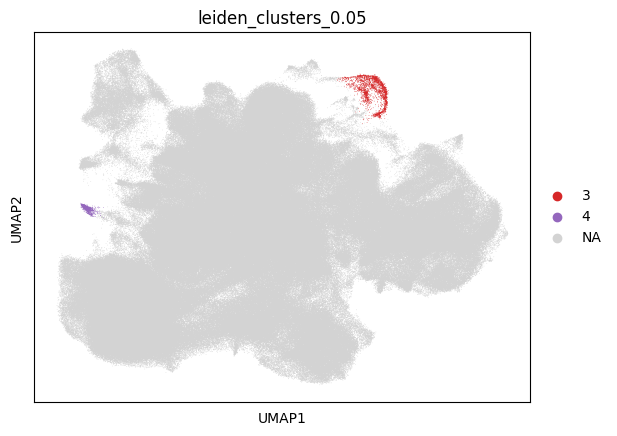

In [89]:
sc.pl.umap(leiden_h5ad,color="leiden_clusters_0.05",groups=['3', "4"],size=1)

/home/zhanglab/mambaforge/envs/celloracle/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


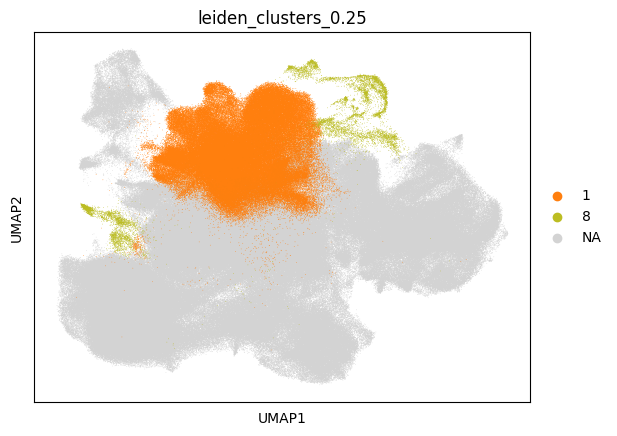

In [92]:
sc.pl.umap(leiden_h5ad,color="leiden_clusters_0.25",groups=['1', "8"],size=1)

/home/zhanglab/mambaforge/envs/celloracle/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


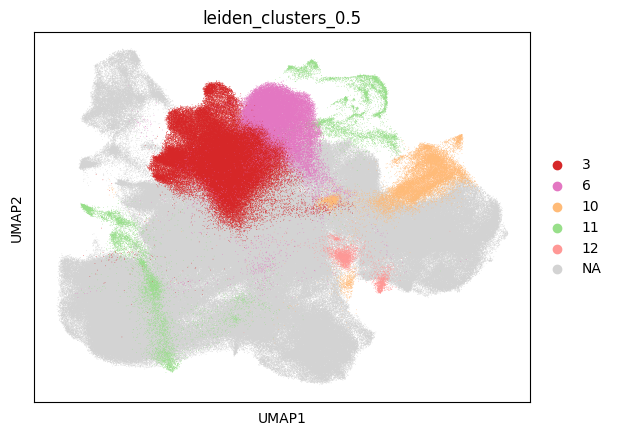

In [93]:
sc.pl.umap(leiden_h5ad,color="leiden_clusters_0.5",groups=['3', '6', '10', '11', '12'],size=1)

In [94]:
x=pd.get_dummies(leidenDf["leiden_clusters_0.5"],drop_first=True)
result=x*np.array(adata.obs["transf_ann_level_3_uncert"]).reshape(-1,1)
result[result == 0] = np.nan
result_mean = np.nanmean(result, axis=0)

In [106]:
adata

AnnData object with n_obs × n_vars = 781397 × 20664
    obs: 'Sample', 'Project', 'Core Dataset', 'Limb Atlas', 'Cranial Atlas', 'Organ', 'Tissue', 'Tissue(Specific)', 'Stage', 'Gene type', 'Treatment', 'Age', 'Age(In Detail)', 'Machine', 'Species', 'Isolation approach', 'Digestion', 'Enzymes', 'Cre', 'Bone Forming Methods', 'Data Source', 'Related Assay', 'Cell Count After QC', 'Origin', 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'paper_label', 'coarse_label', 'scDblFinder_class', 'short_id', 'nCount_originalexp', 'nFeature_originalexp', 'n_genes', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'new_totals_log', 'batch', 'log10_total_counts', 'n_genes_detected', 'mito_frac', 'ribo_frac', 'compl', 'transf_ann_level_7_label', 'transf_ann_level_6_label', 'transf_ann_level_5_label', 'transf_ann_level_4_label', 'transf_ann_level_

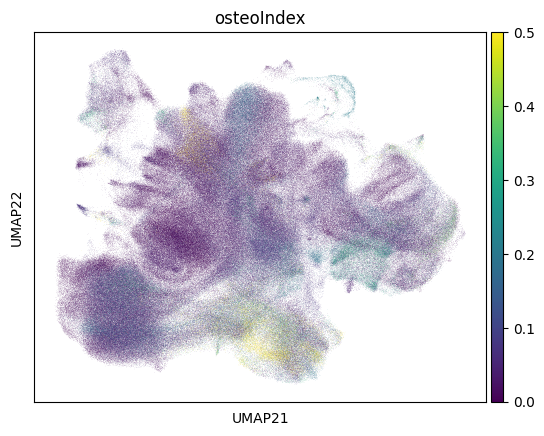

In [114]:
sc.pl.embedding(adata,color="osteoIndex",vmax=0.5,basis="UMAP2")

In [130]:
adata.obs["anno_update_level_2"]

Suture2021_Farmer_E17_AAACCTGCAGACTCGC-1_1-0_1_1           MSC
Suture2021_Farmer_E17_AAACCTGGTGCGGTAA-1_1-0_1_1     Ly6a+ MSC
Suture2021_Farmer_E17_AAACCTGGTGGTCTCG-1_1-0_1_1            Ob
Suture2021_Farmer_E17_AAACCTGTCACCACCT-1_1-0_1_1            Ob
Suture2021_Farmer_E17_AAACCTGTCGTTACGA-1_1-0_1_1    Lepr+ BMSC
                                                       ...    
TTTGTTGAGGTGATAT-1_8                                   Chondro
TTTGTTGAGTCTTCCC-1_8                                       MSC
TTTGTTGGTCCACACG-1_8                                   Chondro
TTTGTTGTCACTACGA-1_8                                   Chondro
TTTGTTGTCCGGGACT-1_8                                   Chondro
Name: anno_update_level_2, Length: 781397, dtype: category
Categories (9, object): ['Chondro', 'Fibroblast', 'Lepr+ BMSC', 'Low quality', ..., 'MSC', 'Novel_mes', 'Ob', 'Pericyte']

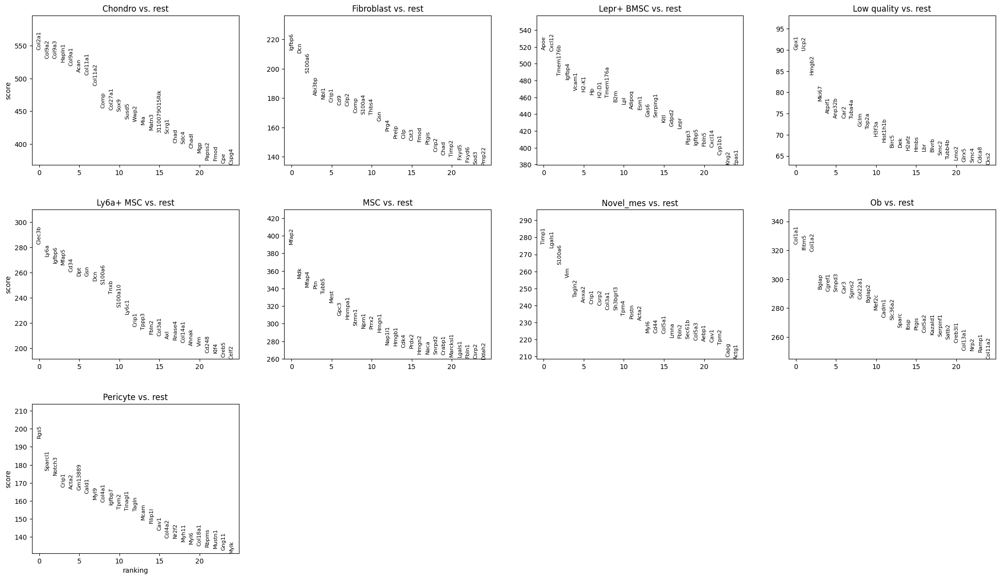

In [153]:
sc.tl.rank_genes_groups(adata, 'anno_update_level_2', method='wilcoxon',use_raw=False)
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

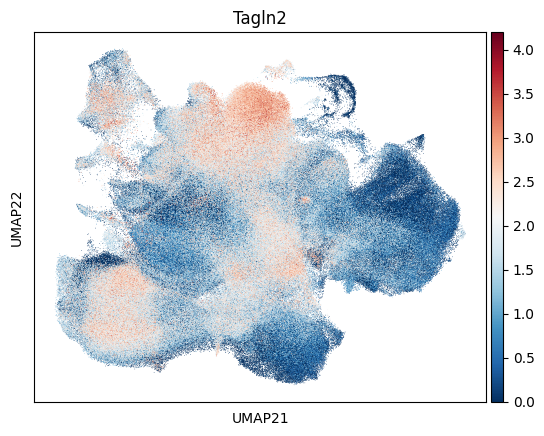

In [155]:
sc.pl.embedding(adata,color="Tagln2",use_raw=False,cmap="RdBu_r",size=1,basis="UMAP2")

In [136]:
adata.var_names

Index(['0610005C13Rik', '0610007N19Rik', '0610007P14Rik', '0610009B22Rik',
       '0610009D07Rik', '0610009E02Rik', '0610009L18Rik', '0610009O20Rik',
       '0610010F05Rik', '0610010K14Rik',
       ...
       'Nscme3l', 'Styx-ps', 'Ccdc121rt2', 'Tgoln2', 'Arih2os', 'Qki',
       'Gm31160', 'Tesl2', 'Nlgn4l', 'Ahsp'],
      dtype='object', length=20664)

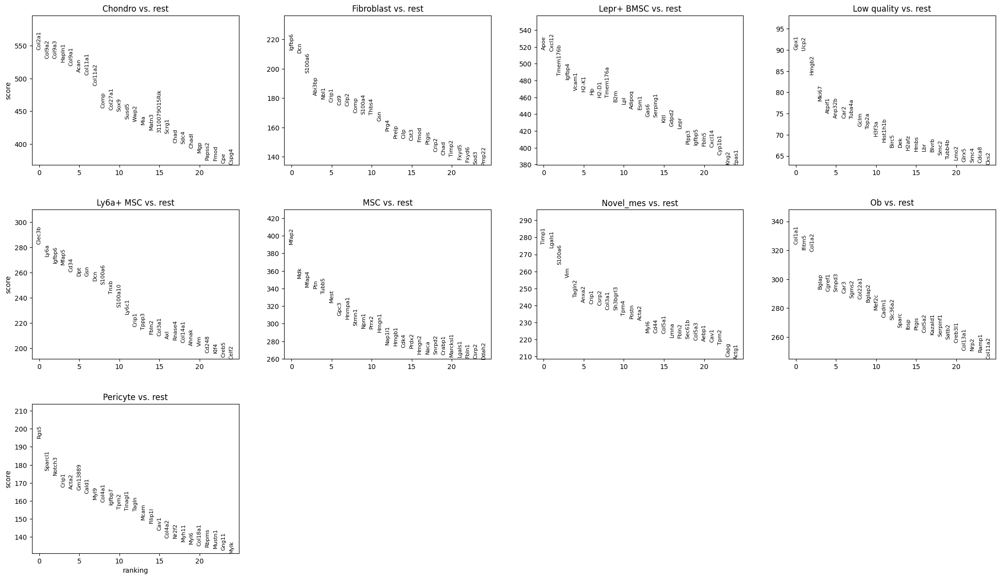

In [154]:
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False,)

In [142]:
result = adata.uns['rank_genes_groups']
groups = result['names'].dtype.names
markerDf=pd.DataFrame(
    {group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names', 'pvals']})

In [143]:
markerDf

,Chondro_n,Chondro_p,Fibroblast_n,Fibroblast_p,Lepr+ BMSC_n,Lepr+ BMSC_p,Low quality_n,Low quality_p,Ly6a+ MSC_n,Ly6a+ MSC_p,MSC_n,MSC_p,Novel_mes_n,Novel_mes_p,Ob_n,Ob_p,Pericyte_n,Pericyte_p
0,9124,0.0,37131,0.0,9584,0.0,60701,0.0,8919,0.0,39614,0.0,56352,0.0,37062,0.0,55405,0.0
1,9147,0.0,10084,0.0,5996,0.0,36046,0.0,39084,0.0,39477,0.0,38705,0.0,9114,0.0,58014,0.0
2,9146,0.0,5077,0.0,36816,0.0,36697,0.0,37131,0.0,39617,0.0,59234,0.0,9115,0.0,42035,0.0
3,36395,0.0,8809,0.0,5418,0.0,40843,0.0,8279,0.0,45569,0.0,58739,0.0,7038,0.0,15868,0.0
4,9145,0.0,41629,0.0,11408,0.0,7814,0.0,39618,0.0,39564,0.0,60972,0.0,7815,0.0,5247,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
66510,38705,0.0,39355,0.0,42075,0.0,9115,0.0,56313,0.0,45184,0.0,36991,0.0,37132,0.0,37883,0.0
66511,37129,0.0,39354,0.0,56009,0.0,55261,0.0,59424,0.0,42299,0.0,56999,0.0,44768,0.0,41703,0.0
66512,39354,0.0,59425,0.0,44599,0.0,7041,0.0,59425,0.0,36280,0.0,9248,0.0,37129,0.0,8952,0.0
66513,37061,0.0,59424,0.0,11009,0.0,58013,0.0,9104,0.0,61974,0.0,9124,0.0,39533,0.0,10084,0.0


In [156]:
mesMarkerdf = sc.get.rank_genes_groups_df(adata, group="Novel_mes")

In [158]:
mesMarkerdf.to_csv("../result/9.18_novel_celltype/9.22_marker.csv")

In [165]:
leiden_h5ad

AnnData object with n_obs × n_vars = 781397 × 15
    obs: 'Sample', 'Project', 'Core Dataset', 'Limb Atlas', 'Cranial Atlas', 'Organ', 'Tissue', 'Tissue(Specific)', 'Stage', 'Gene type', 'Treatment', 'Age', 'Age(In Detail)', 'Machine', 'Species', 'Isolation approach', 'Digestion', 'Enzymes', 'Cre', 'Bone Forming Methods', 'Data Source', 'Related Assay', 'Cell Count After QC', 'Origin', 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'paper_label', 'coarse_label', 'scDblFinder_class', 'short_id', 'nCount_originalexp', 'nFeature_originalexp', 'n_genes', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'new_totals_log', 'batch', '_scvi_batch', 'scanvi_label', '_scvi_labels', 'leiden', 'pred_anno', 'reject', 'pred_anno7', 'pred_anno19', 'pred_anno36', 'pred_anno49', 'pred_anno90', 'leiden_clusters_0.001', 'leiden_clusters_0.005', 'leide

In [ ]:
import fa2
sc.tl.draw_graph(leiden_h5ad)

/home/zhanglab/mambaforge/envs/celloracle/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  cax = scatter(


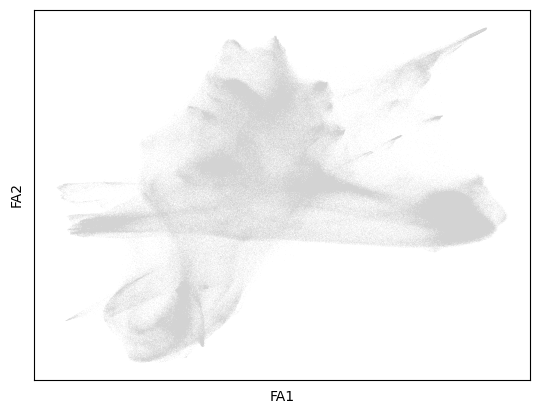

In [164]:
sc.pl.draw_graph(leiden_h5ad,color=)

In [166]:
adata.obsm["X_draw_graph_fa"]=leiden_h5ad.obsm["X_draw_graph_fa"]

/home/zhanglab/mambaforge/envs/celloracle/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


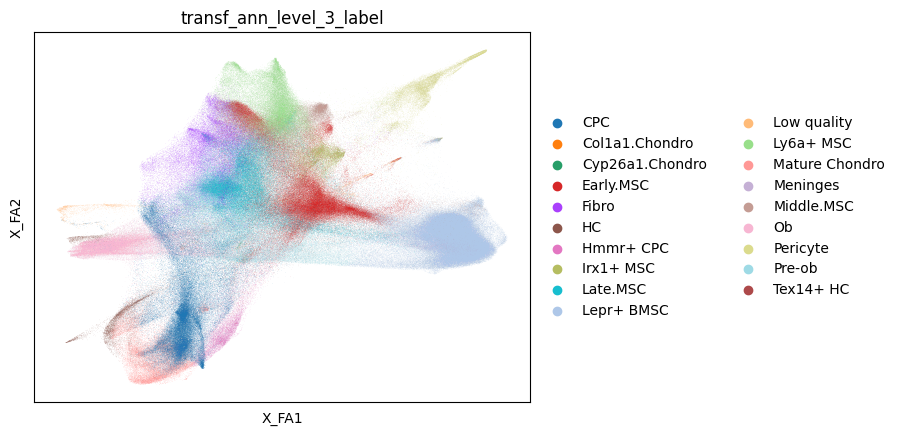

In [168]:
sc.pl.embedding(adata,color="transf_ann_level_3_label",basis="X_draw_graph_fa")

/home/zhanglab/mambaforge/envs/celloracle/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


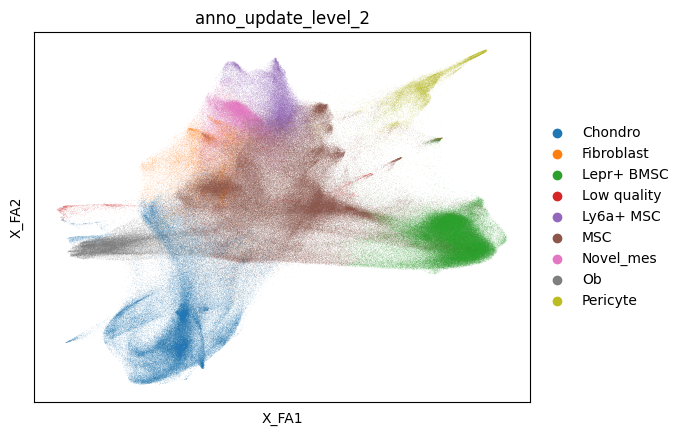

In [169]:
sc.pl.embedding(adata,color="anno_update_level_2",basis="X_draw_graph_fa")